In [1]:
import pandas as pd
import os
import glob
from train import Config
import matplotlib.pyplot as plt

config = Config()
config.fonts_folder = "all_fonts_filtered"

In [77]:
dir_path = os.getcwd()
font_files = glob.glob(os.path.join(dir_path, f'{config.fonts_folder}/*.ttf'), recursive=True)
font_files.sort()
font_files_dict = {}
for file in font_files:
    basename = os.path.splitext(os.path.basename(file))[0]
    basename = basename.split("[")[0].split("-")[0]
    if basename.startswith("NotoSans"):
        basename = "NotoSans"
    elif basename.startswith("NotoSerif"):
        basename = "NotoSerif"
    font_files_dict[file] = basename

a = sorted(list(set(font_files_dict.values())))
a 

['42dotSans',
 'ABeeZee',
 'ADLaMDisplay',
 'AROneSans',
 'Abel',
 'AbhayaLibre',
 'Aboreto',
 'AbrilFatface',
 'AbyssinicaSIL',
 'Aclonica',
 'Acme',
 'Actor',
 'Adamina',
 'AdventPro',
 'Afacad',
 'AfacadFlux',
 'Agbalumo',
 'Agdasima',
 'AguDisplay',
 'AguafinaScript',
 'Akatab',
 'AkayaKanadaka',
 'AkayaTelivigala',
 'Akronim',
 'Akshar',
 'Aladin',
 'Alata',
 'Alatsi',
 'AlbertSans',
 'Aldrich',
 'Alef',
 'Alegreya',
 'AlegreyaSC',
 'AlegreyaSans',
 'AlegreyaSansSC',
 'Aleo',
 'AlexBrush',
 'Alexandria',
 'AlfaSlabOne',
 'Alice',
 'Alike',
 'AlikeAngular',
 'Alkalami',
 'Alkatra',
 'Allan',
 'Allerta',
 'AllertaStencil',
 'Allison',
 'Allura',
 'Almarai',
 'Almendra',
 'AlmendraDisplay',
 'AlmendraSC',
 'AlumniSans',
 'AlumniSansCollegiateOne',
 'AlumniSansCollegiateOneSC',
 'AlumniSansInlineOne',
 'AlumniSansPinstripe',
 'AlumniSansSC',
 'Amarante',
 'Amaranth',
 'AmaticSC',
 'Amethysta',
 'Amiko',
 'Amiri',
 'AmiriQuran',
 'Amita',
 'AmstelvarAlpha',
 'Anaheim',
 'AncizarSans',


In [78]:
len(a)

1738

## Model correlation matrix

In [2]:
import torch

from utils import GoogleFontsClassifier_ResNet18


model = GoogleFontsClassifier_ResNet18(1967, dropout=config.dropout)
model.load_state_dict(torch.load("model/model_resnet18_full.pth", map_location=torch.device('cpu')))
model.eval()


/tmp/ipykernel_51627/662399397.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("model/model_resnet18_full.pth", map_location=torch.devic

GoogleFontsClassifier_ResNet18(
  (resnet): ResNet(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, 

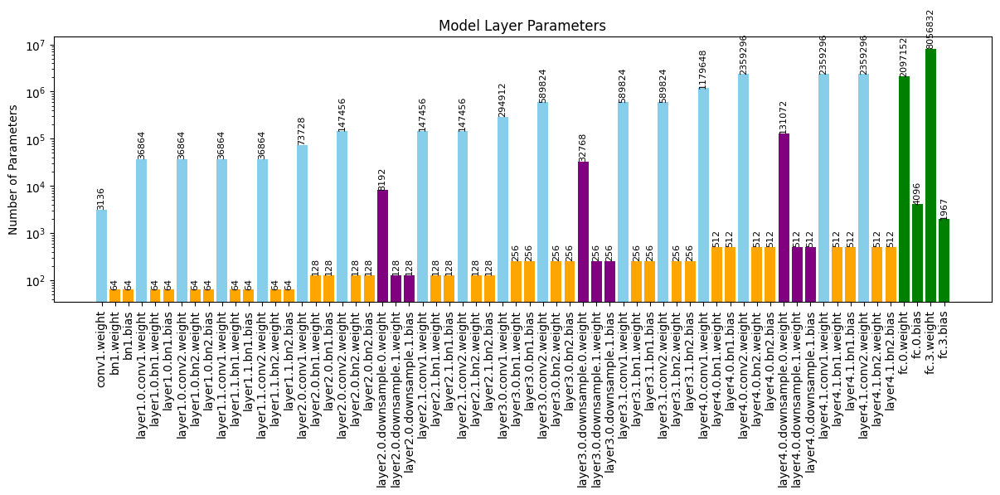

In [41]:
layer_params = {}
for name, param in model.named_parameters():
    layer_params[name[7:]] = layer_params.get(name, 0) + param.numel()

plt.figure(figsize=(12, 6))
colors = []
for k in layer_params.keys():
    if 'conv' in k:
        colors.append('skyblue')
    elif 'bn' in k:
        colors.append('orange')
    elif 'fc' in k or 'linear' in k:
        colors.append('green')
    elif 'downsample' in k:
        colors.append('purple')
    else:
        colors.append('gray')

bars = plt.bar(list(layer_params.keys()), list(layer_params.values()), color=colors)
for bar, value in zip(bars, layer_params.values()):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(value), ha='center', va='bottom', fontsize=8, rotation=90)
plt.xticks(rotation=90)
plt.ylabel("Number of Parameters")
plt.title("Model Layer Parameters")
plt.tight_layout()
plt.yscale('log')
plt.show()



In [52]:
model.resnet.fc[0]

Linear(in_features=512, out_features=4096, bias=True)

In [5]:
from dataloader import Datagenerator

dg = Datagenerator(config)
dg.deterministic = True

dg[10]

(tensor([[255., 255., 255.,  ..., 255., 255., 255.],
         [255., 255., 255.,  ..., 255., 255., 255.],
         [255., 255., 255.,  ..., 255., 255., 255.],
         ...,
         [255., 255., 255.,  ..., 255., 255., 255.],
         [255., 255., 255.,  ..., 255., 255., 255.],
         [255., 255., 255.,  ..., 255., 255., 255.]]),
 tensor(10))

In [24]:
for i in range(1963):
    image = dg[i][0].unsqueeze(0)
    prediction = torch.argmax(model(image)).item()

    if prediction != i:
        print(f"Prediction for {i} is {prediction}, the font is {dg.fonts_unique[i]}")


Prediction for 13 is 629, the font is AdobeBlank
Prediction for 22 is 23, the font is AkayaKanadaka
Prediction for 25 is 629, the font is AksaraBaliGalang
Prediction for 57 is 56, the font is AlumniSansCollegiateOneSC
Prediction for 67 is 66, the font is AmiriQuran
Prediction for 76 is 77, the font is AnekDevanagari
Prediction for 78 is 84, the font is AnekGurmukhi
Prediction for 79 is 77, the font is AnekKannada
Prediction for 80 is 77, the font is AnekLatin
Prediction for 81 is 77, the font is AnekMalayalam
Prediction for 82 is 81, the font is AnekOdia
Prediction for 83 is 77, the font is AnekTamil
Prediction for 84 is 77, the font is AnekTelugu
Prediction for 108 is 107, the font is ArefRuqaaInk
Prediction for 147 is 858, the font is BIZUDPMincho
Prediction for 159 is 165, the font is Baloo2
Prediction for 160 is 165, the font is BalooBhai2
Prediction for 161 is 165, the font is BalooBhaijaan2
Prediction for 163 is 165, the font is BalooChettan2
Prediction for 164 is 160, the font i

Prediction for 13 is 629, the font is AdobeBlank


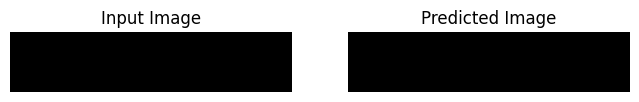

Prediction for 25 is 629, the font is AksaraBaliGalang


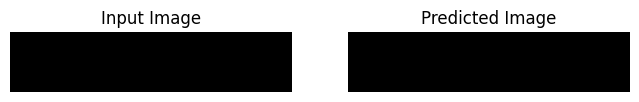

Prediction for 35 is 1015, the font is AlegreyaSans


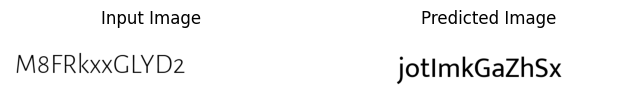

Prediction for 36 is 1015, the font is AlegreyaSansSC


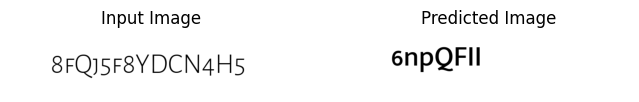

Prediction for 87 is 1816, the font is AnnieUseYourTelescope


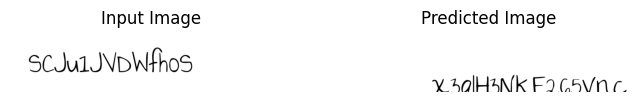

Prediction for 119 is 1647, the font is AsapCondensed


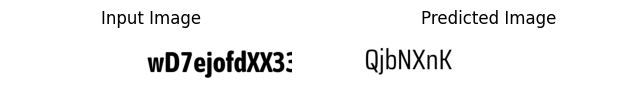

Prediction for 172 is 1659, the font is Barlow


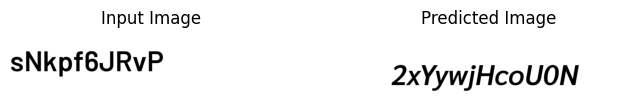

Prediction for 184 is 1766, the font is Bayon


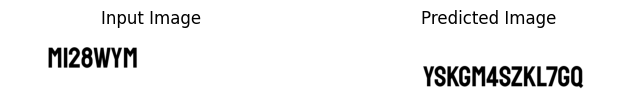

Prediction for 291 is 1530, the font is Cambay


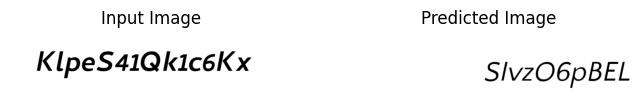

Prediction for 309 is 1827, the font is Castoro


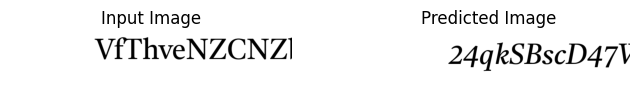

Prediction for 312 is 1812, the font is Caudex


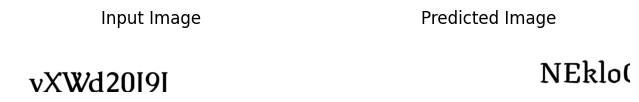

Prediction for 360 is 401, the font is ConcertOne


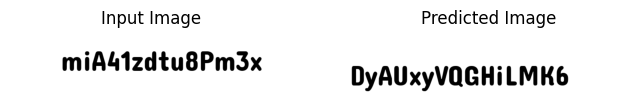

Prediction for 362 is 328, the font is Content


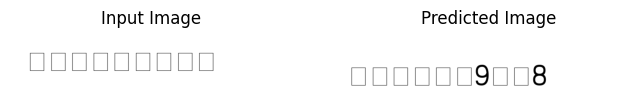

Prediction for 416 is 1959, the font is Devonshire


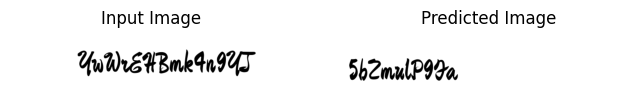

Prediction for 495 is 1802, the font is Fasthand


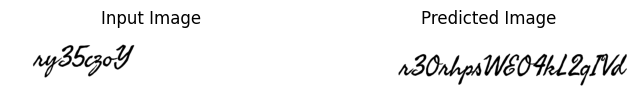

Prediction for 531 is 1802, the font is Freehand


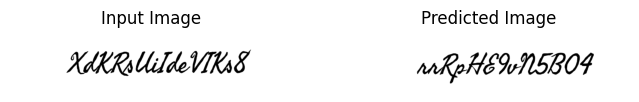

Prediction for 618 is 712, the font is Gwendolyn


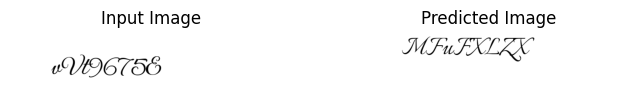

Prediction for 636 is 1878, the font is Heebo


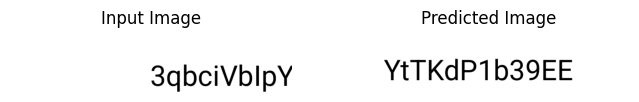

Prediction for 656 is 1558, the font is HostGrotesk


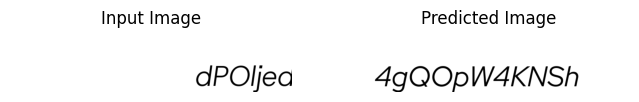

Prediction for 708 is 823, the font is IrishGrover


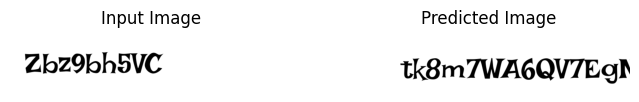

Prediction for 774 is 629, the font is KarlaTamilUpright


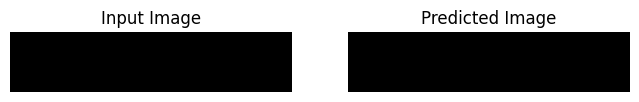

Prediction for 799 is 1271, the font is KohSantepheap


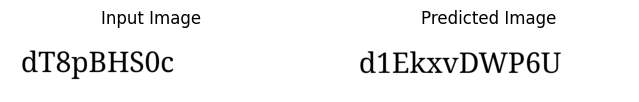

Prediction for 800 is 629, the font is Kokoro


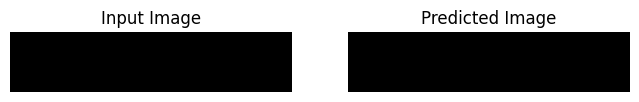

Prediction for 806 is 184, the font is Koulen


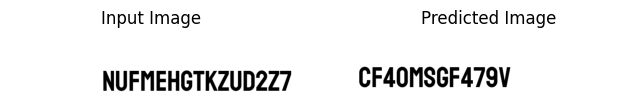

Prediction for 847 is 1498, the font is LibertinusMath


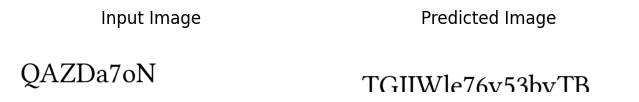

Prediction for 876 is 553, the font is Lobster


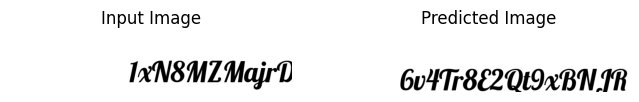

Prediction for 903 is 1959, the font is MaShanZheng


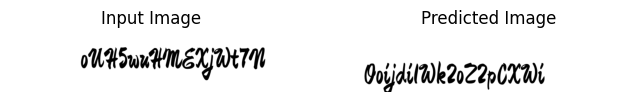

Prediction for 924 is 819, the font is MarckScript


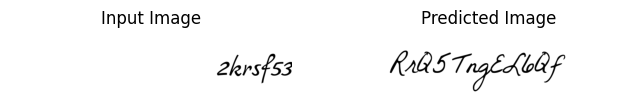

Prediction for 972 is 1358, the font is Mitr


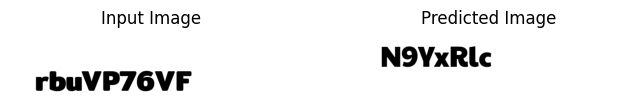

Prediction for 987 is 424, the font is MonomaniacOne


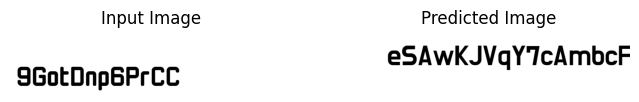

Prediction for 990 is 248, the font is Montaga


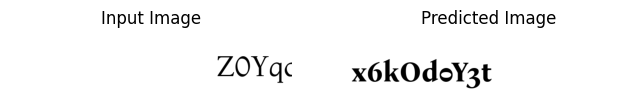

Prediction for 1013 is 456, the font is Mukta


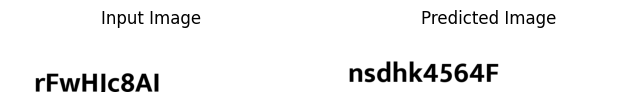

Prediction for 1021 is 1930, the font is MyanmarSansPro


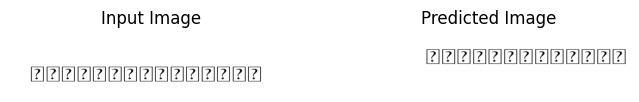

Prediction for 1047 is 629, the font is Nikukyu


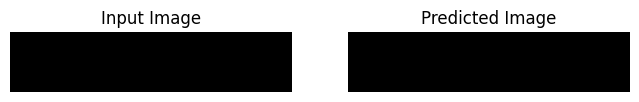

Prediction for 1059 is 1073, the font is NotoKufiArabic


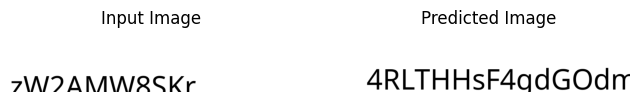

Prediction for 1060 is 1159, the font is NotoMusic


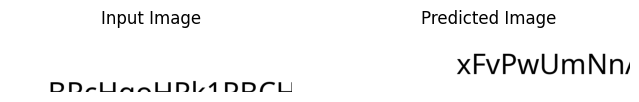

Prediction for 1063 is 1262, the font is NotoNastaliqUrdu


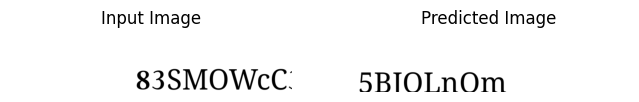

Prediction for 1065 is 1207, the font is NotoSans


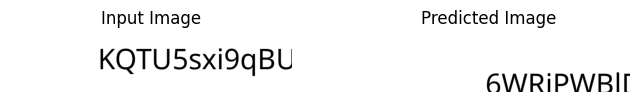

Prediction for 1066 is 1212, the font is NotoSansAdlam


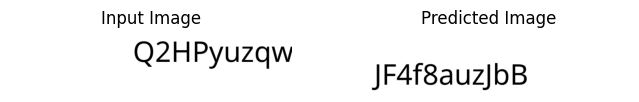

Prediction for 1067 is 1166, the font is NotoSansAdlamUnjoined


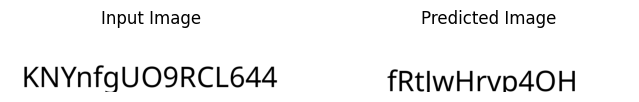

Prediction for 1068 is 1239, the font is NotoSansAnatolianHieroglyphs


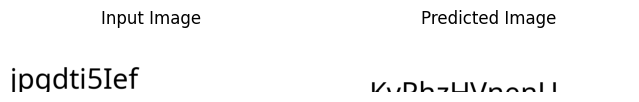

Prediction for 1069 is 1166, the font is NotoSansArabic


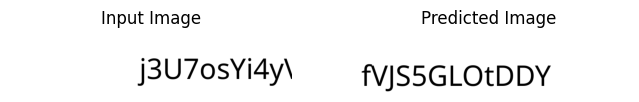

Prediction for 1071 is 1207, the font is NotoSansArmenian


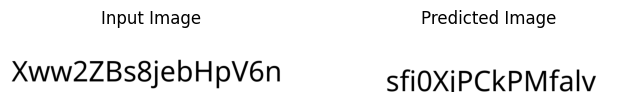

Prediction for 1072 is 1182, the font is NotoSansAvestan


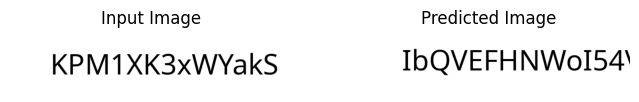

Prediction for 1073 is 1207, the font is NotoSansBalinese


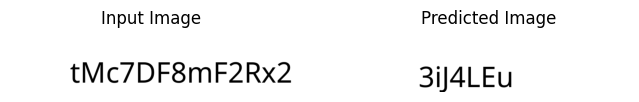

Prediction for 1074 is 1166, the font is NotoSansBamum


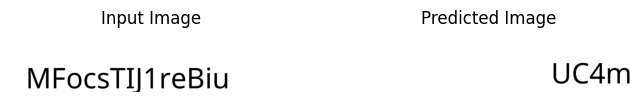

Prediction for 1075 is 1207, the font is NotoSansBassaVah


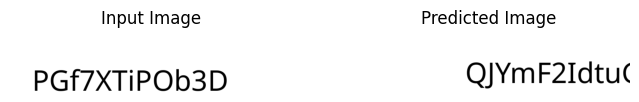

Prediction for 1076 is 1232, the font is NotoSansBatak


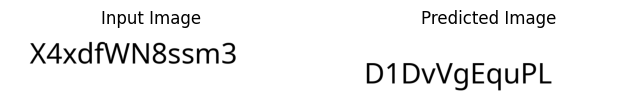

Prediction for 1077 is 1207, the font is NotoSansBengali


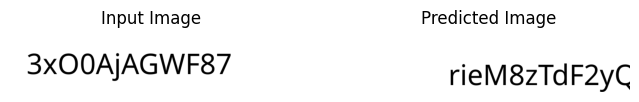

Prediction for 1079 is 1232, the font is NotoSansBhaiksuki


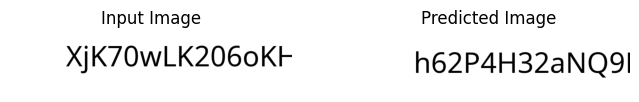

Prediction for 1080 is 1177, the font is NotoSansBrahmi


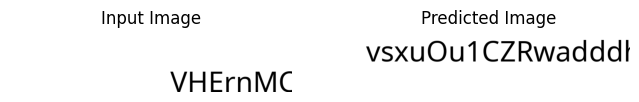

Prediction for 1081 is 1149, the font is NotoSansBuginese


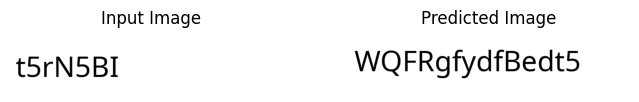

Prediction for 1082 is 1207, the font is NotoSansBuhid


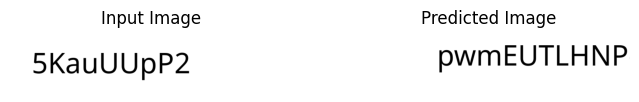

Prediction for 1083 is 1207, the font is NotoSansCanadianAboriginal


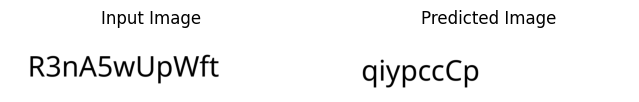

Prediction for 1084 is 1239, the font is NotoSansCarian


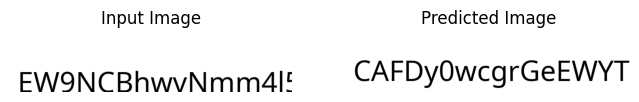

Prediction for 1085 is 1182, the font is NotoSansCaucasianAlbanian


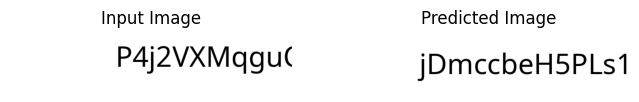

Prediction for 1086 is 1106, the font is NotoSansChakma


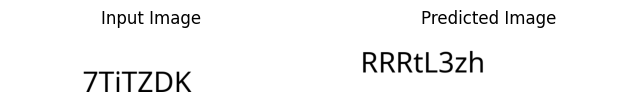

Prediction for 1087 is 1207, the font is NotoSansCham


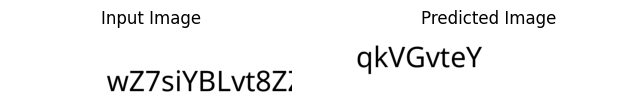

Prediction for 1088 is 1183, the font is NotoSansCherokee


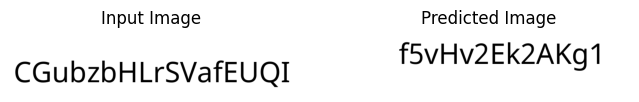

Prediction for 1089 is 1232, the font is NotoSansChorasmian


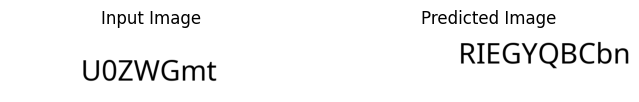

Prediction for 1090 is 1165, the font is NotoSansCoptic


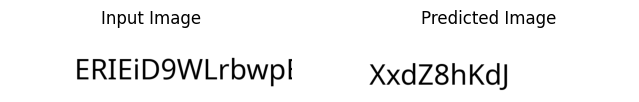

Prediction for 1092 is 1182, the font is NotoSansCypriot


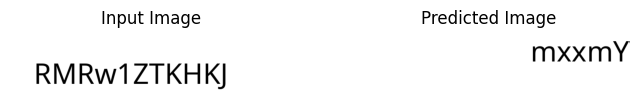

Prediction for 1093 is 1189, the font is NotoSansCyproMinoan


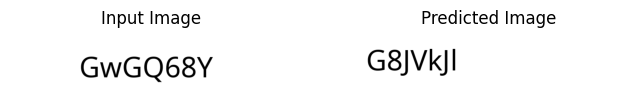

Prediction for 1094 is 1177, the font is NotoSansDeseret


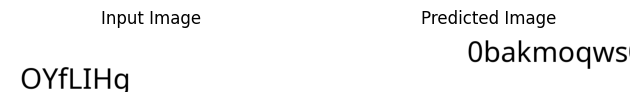

Prediction for 1095 is 1207, the font is NotoSansDevanagari


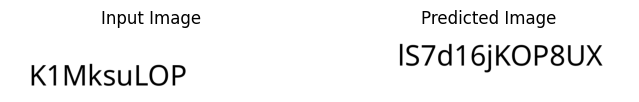

Prediction for 1098 is 1313, the font is NotoSansDuployan


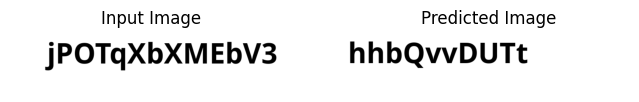

Prediction for 1099 is 1232, the font is NotoSansEgyptianHieroglyphs


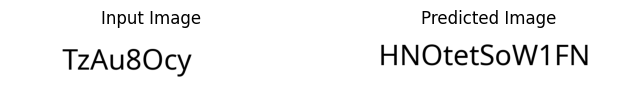

Prediction for 1100 is 1232, the font is NotoSansElbasan


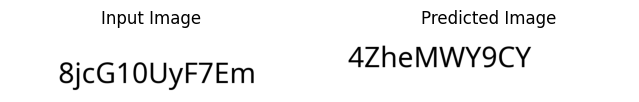

Prediction for 1101 is 1147, the font is NotoSansElymaic


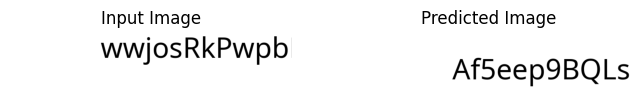

Prediction for 1102 is 1067, the font is NotoSansEthiopic


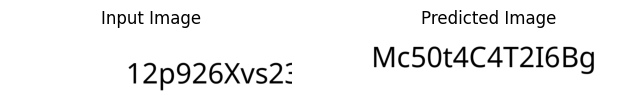

Prediction for 1103 is 1212, the font is NotoSansGeorgian


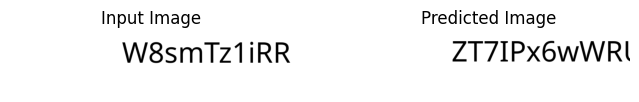

Prediction for 1104 is 1232, the font is NotoSansGlagolitic


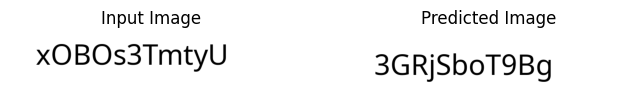

Prediction for 1105 is 1209, the font is NotoSansGothic


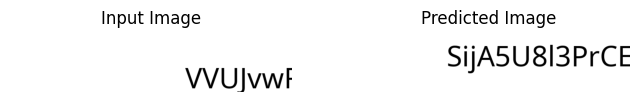

Prediction for 1106 is 1232, the font is NotoSansGrantha


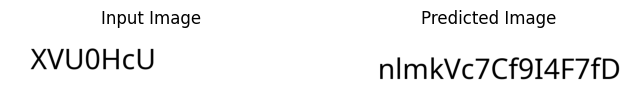

Prediction for 1107 is 1207, the font is NotoSansGujarati


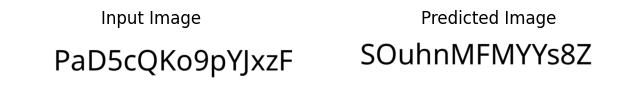

Prediction for 1109 is 1067, the font is NotoSansGunjalaGondi


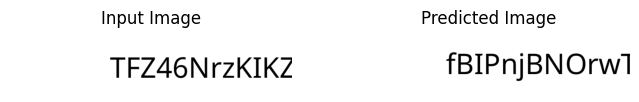

Prediction for 1110 is 1095, the font is NotoSansGurmukhi


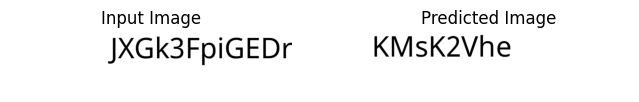

Prediction for 1111 is 1078, the font is NotoSansGurmukhiUI


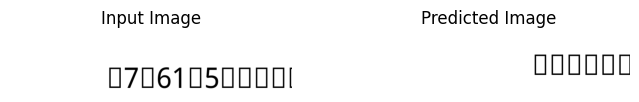

Prediction for 1112 is 1123, the font is NotoSansHK


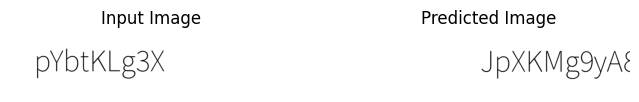

Prediction for 1113 is 1207, the font is NotoSansHanifiRohingya


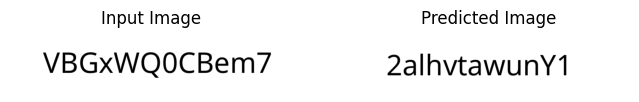

Prediction for 1114 is 1232, the font is NotoSansHanunoo


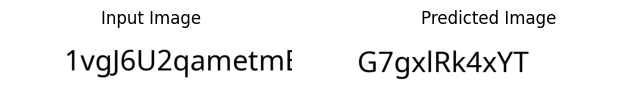

Prediction for 1115 is 1177, the font is NotoSansHatran


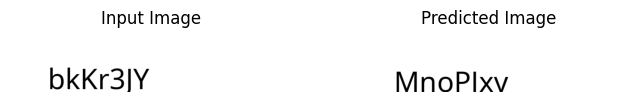

Prediction for 1117 is 1232, the font is NotoSansImperialAramaic


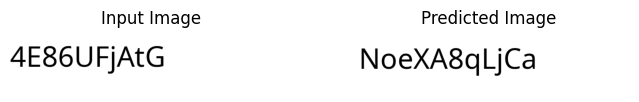

Prediction for 1118 is 1165, the font is NotoSansIndicSiyaqNumbers


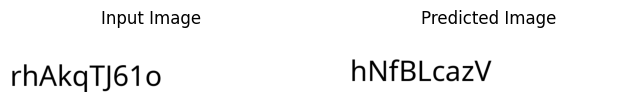

Prediction for 1119 is 1165, the font is NotoSansInscriptionalPahlavi


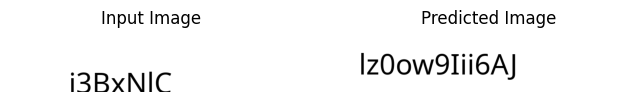

Prediction for 1120 is 1165, the font is NotoSansInscriptionalParthian


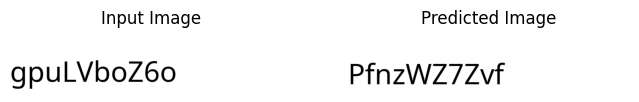

Prediction for 1121 is 1214, the font is NotoSansJP


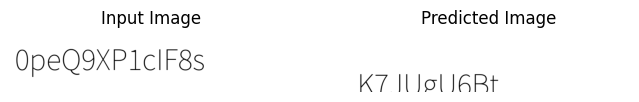

Prediction for 1122 is 1067, the font is NotoSansJavanese


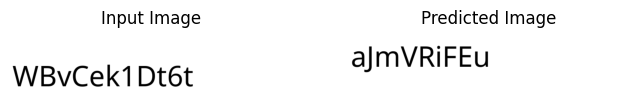

Prediction for 1124 is 1165, the font is NotoSansKaithi


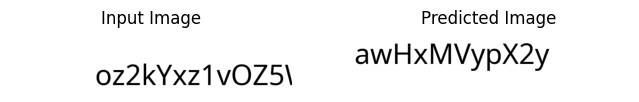

Prediction for 1127 is 1207, the font is NotoSansKawi


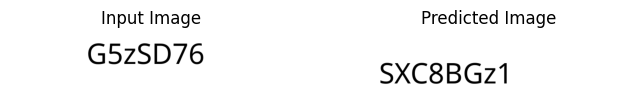

Prediction for 1128 is 1073, the font is NotoSansKayahLi


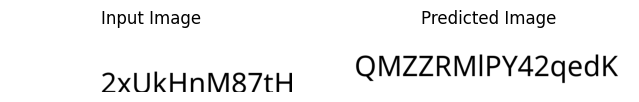

Prediction for 1129 is 1165, the font is NotoSansKharoshthi


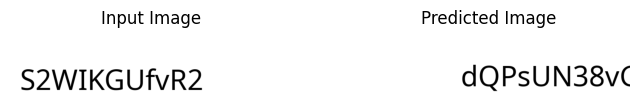

Prediction for 1130 is 1207, the font is NotoSansKhmer


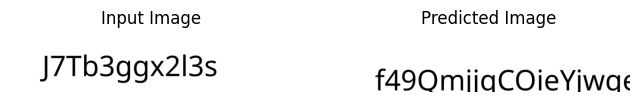

Prediction for 1132 is 1182, the font is NotoSansKhojki


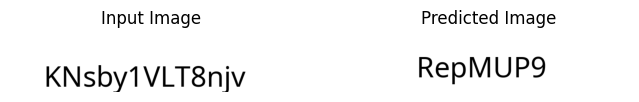

Prediction for 1133 is 1189, the font is NotoSansKhudawadi


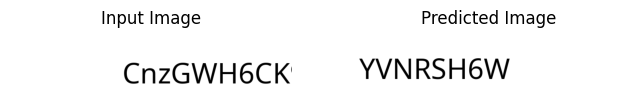

Prediction for 1134 is 1207, the font is NotoSansLao


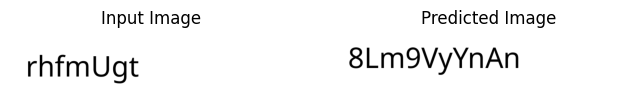

Prediction for 1135 is 1207, the font is NotoSansLaoLooped


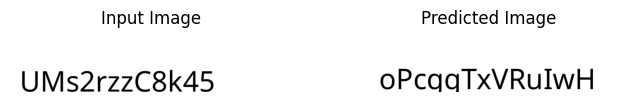

Prediction for 1137 is 1232, the font is NotoSansLepcha


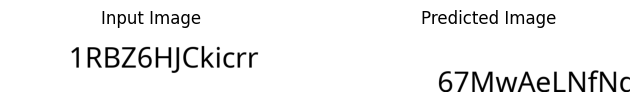

Prediction for 1138 is 1232, the font is NotoSansLimbu


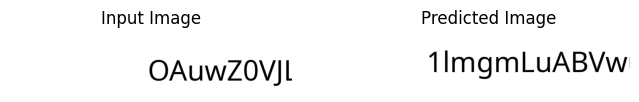

Prediction for 1139 is 1232, the font is NotoSansLinearA


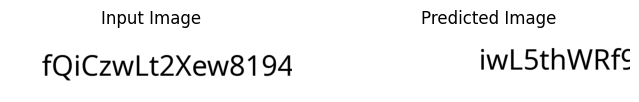

Prediction for 1140 is 1232, the font is NotoSansLinearB


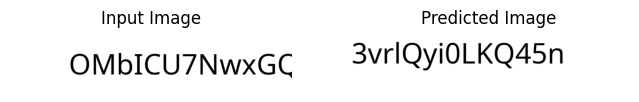

Prediction for 1141 is 1207, the font is NotoSansLisu


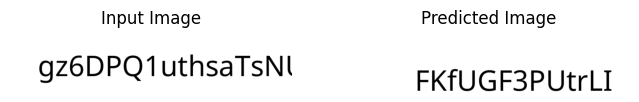

Prediction for 1142 is 1165, the font is NotoSansLycian


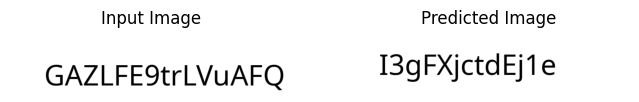

Prediction for 1143 is 1209, the font is NotoSansLydian


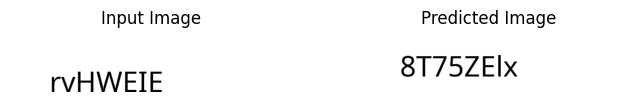

Prediction for 1144 is 1232, the font is NotoSansMahajani


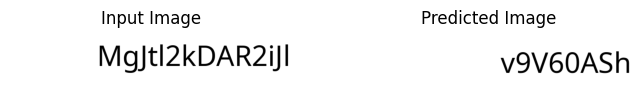

Prediction for 1145 is 1221, the font is NotoSansMalayalam


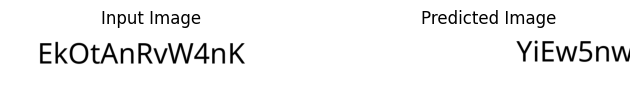

Prediction for 1146 is 1070, the font is NotoSansMalayalamUI


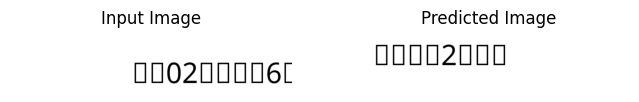

Prediction for 1149 is 1209, the font is NotoSansMarchen


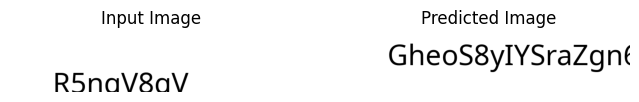

Prediction for 1150 is 1232, the font is NotoSansMasaramGondi


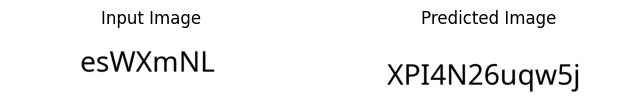

Prediction for 1151 is 1182, the font is NotoSansMath


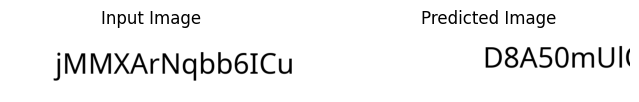

Prediction for 1152 is 1182, the font is NotoSansMayanNumerals


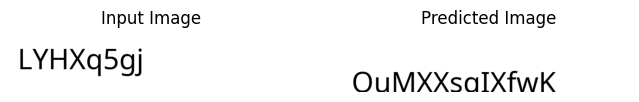

Prediction for 1153 is 1207, the font is NotoSansMedefaidrin


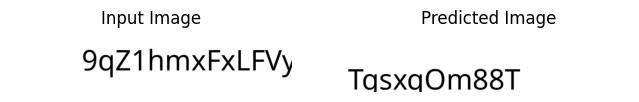

Prediction for 1154 is 1067, the font is NotoSansMeeteiMayek


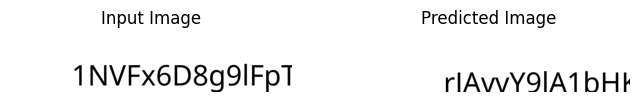

Prediction for 1155 is 1232, the font is NotoSansMendeKikakui


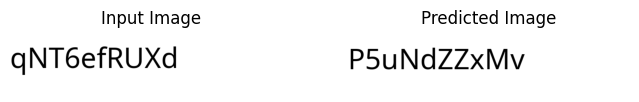

Prediction for 1157 is 1232, the font is NotoSansMiao


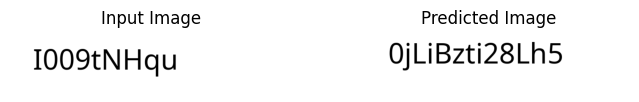

Prediction for 1158 is 1147, the font is NotoSansModi


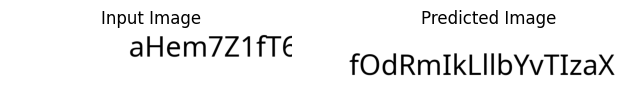

Prediction for 1159 is 1143, the font is NotoSansMongolian


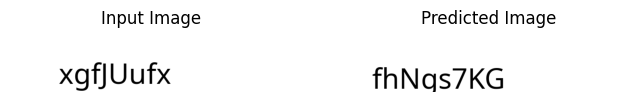

Prediction for 1161 is 1232, the font is NotoSansMro


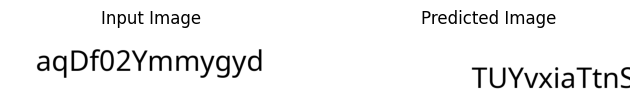

Prediction for 1162 is 1232, the font is NotoSansMultani


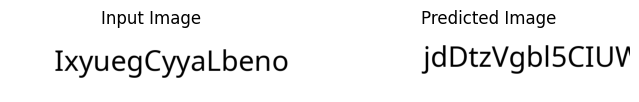

Prediction for 1163 is 1183, the font is NotoSansMyanmar


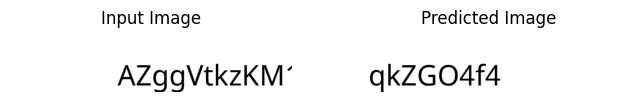

Prediction for 1165 is 1232, the font is NotoSansNKo


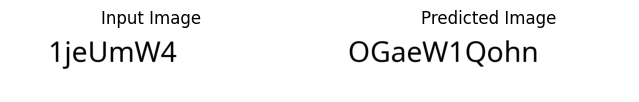

Prediction for 1166 is 1207, the font is NotoSansNKoUnjoined


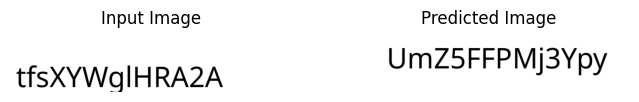

Prediction for 1167 is 1209, the font is NotoSansNabataean


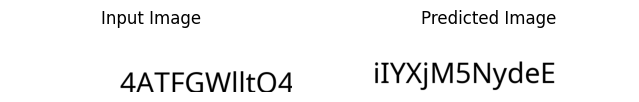

Prediction for 1170 is 1207, the font is NotoSansNewTaiLue


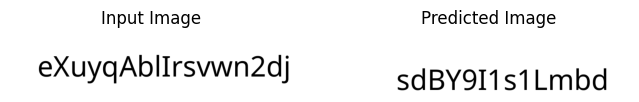

Prediction for 1171 is 1182, the font is NotoSansNewa


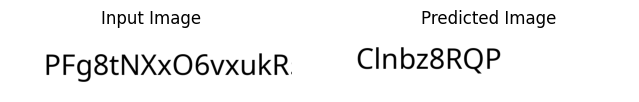

Prediction for 1172 is 1232, the font is NotoSansNushu


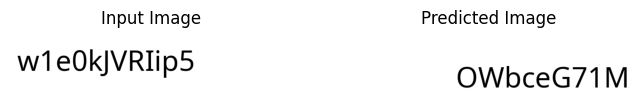

Prediction for 1174 is 1207, the font is NotoSansOlChiki


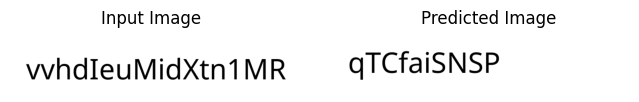

Prediction for 1175 is 1232, the font is NotoSansOldHungarian


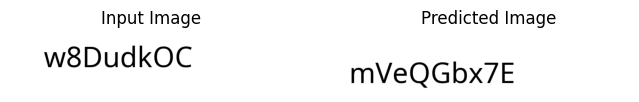

Prediction for 1176 is 1232, the font is NotoSansOldItalic


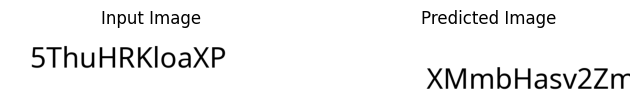

Prediction for 1177 is 1189, the font is NotoSansOldNorthArabian


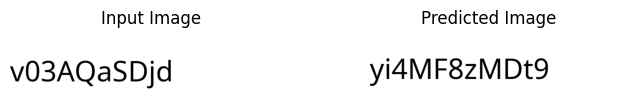

Prediction for 1178 is 1232, the font is NotoSansOldPermic


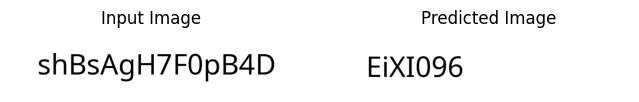

Prediction for 1179 is 1209, the font is NotoSansOldPersian


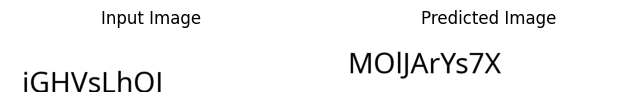

Prediction for 1182 is 1143, the font is NotoSansOldTurkic


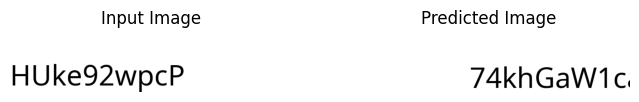

Prediction for 1185 is 1143, the font is NotoSansOsage


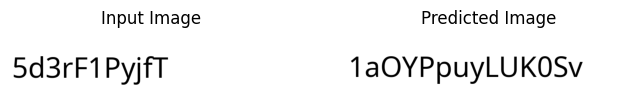

Prediction for 1186 is 1232, the font is NotoSansOsmanya


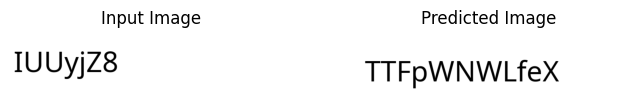

Prediction for 1187 is 1147, the font is NotoSansPahawhHmong


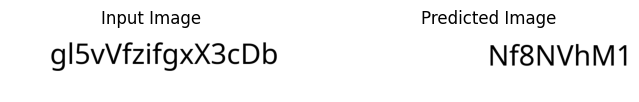

Prediction for 1189 is 1232, the font is NotoSansPauCinHau


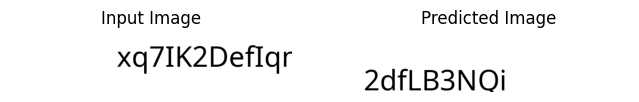

Prediction for 1190 is 1206, the font is NotoSansPhagsPa


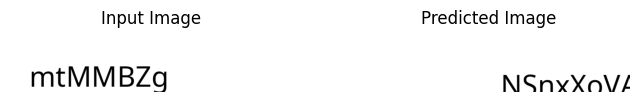

Prediction for 1191 is 1232, the font is NotoSansPhoenician


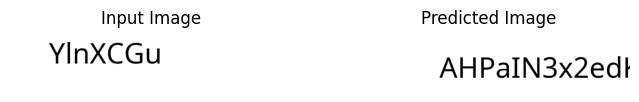

Prediction for 1192 is 1147, the font is NotoSansPsalterPahlavi


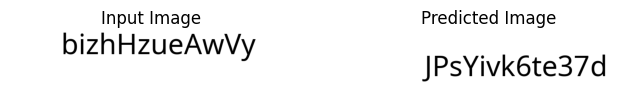

Prediction for 1193 is 1147, the font is NotoSansRejang


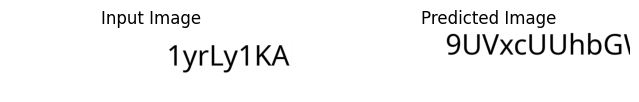

Prediction for 1194 is 1182, the font is NotoSansRunic


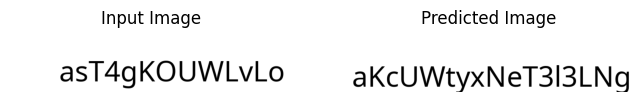

Prediction for 1195 is 1214, the font is NotoSansSC


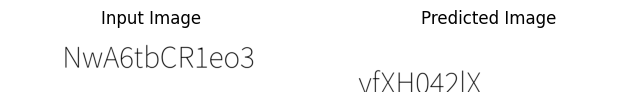

Prediction for 1196 is 1232, the font is NotoSansSamaritan


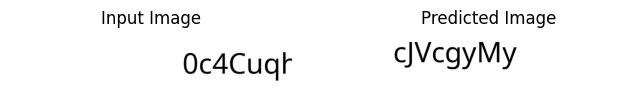

Prediction for 1197 is 1232, the font is NotoSansSaurashtra


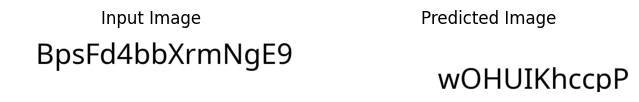

Prediction for 1199 is 1182, the font is NotoSansShavian


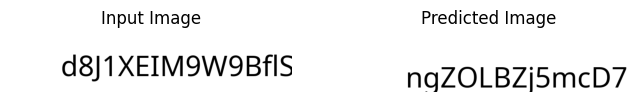

Prediction for 1200 is 1232, the font is NotoSansSiddham


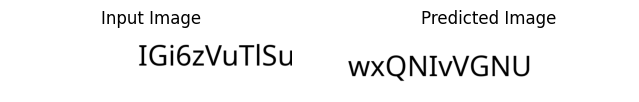

Prediction for 1201 is 1147, the font is NotoSansSignWriting


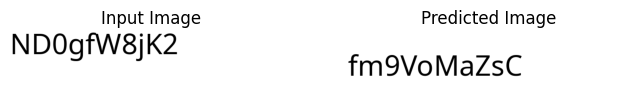

Prediction for 1204 is 1232, the font is NotoSansSogdian


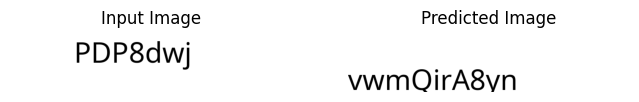

Prediction for 1206 is 1232, the font is NotoSansSoyombo


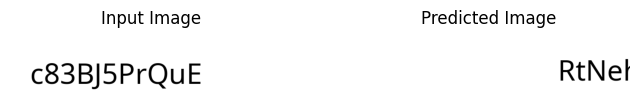

Prediction for 1207 is 1166, the font is NotoSansSundanese


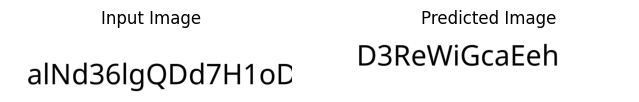

Prediction for 1208 is 1231, the font is NotoSansSunuwar


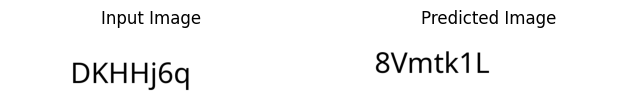

Prediction for 1209 is 1232, the font is NotoSansSylotiNagri


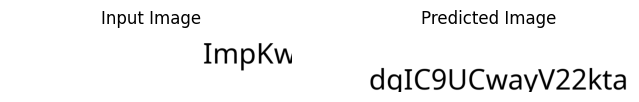

Prediction for 1210 is 1166, the font is NotoSansSymbols


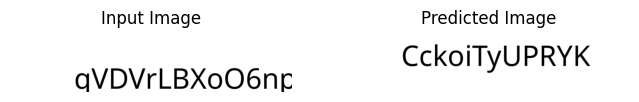

Prediction for 1211 is 1165, the font is NotoSansSymbols2


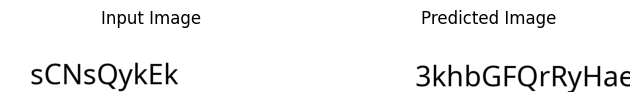

Prediction for 1213 is 1095, the font is NotoSansSyriacEastern


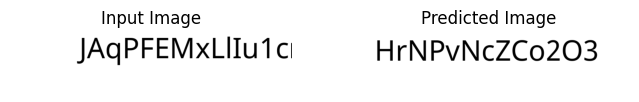

Prediction for 1214 is 1123, the font is NotoSansTC


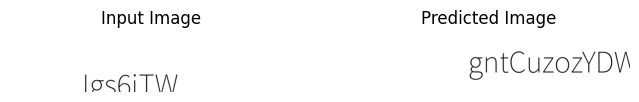

Prediction for 1215 is 1232, the font is NotoSansTagalog


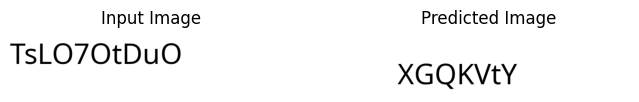

Prediction for 1216 is 1232, the font is NotoSansTagbanwa


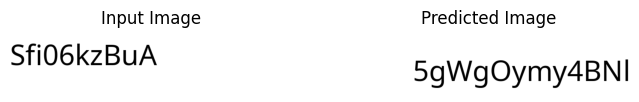

Prediction for 1217 is 1182, the font is NotoSansTaiLe


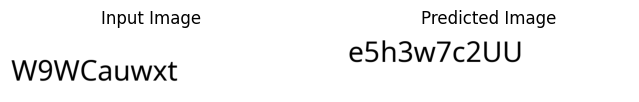

Prediction for 1219 is 1165, the font is NotoSansTaiViet


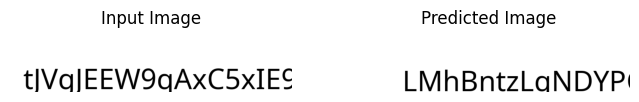

Prediction for 1220 is 1232, the font is NotoSansTakri


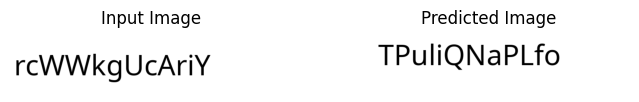

Prediction for 1221 is 1183, the font is NotoSansTamil


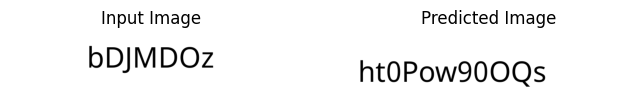

Prediction for 1222 is 1232, the font is NotoSansTamilSupplement


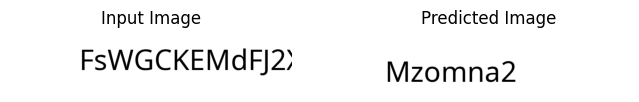

Prediction for 1223 is 1070, the font is NotoSansTamilUI


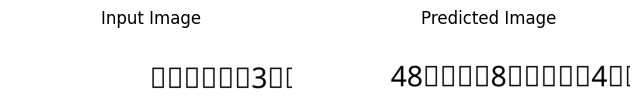

Prediction for 1224 is 1207, the font is NotoSansTangsa


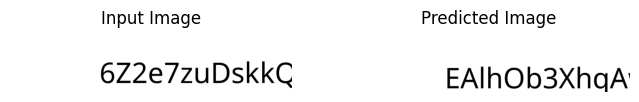

Prediction for 1225 is 1207, the font is NotoSansTelugu


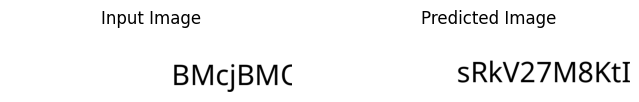

Prediction for 1227 is 1207, the font is NotoSansThaana


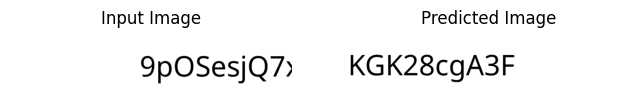

Prediction for 1228 is 1207, the font is NotoSansThai


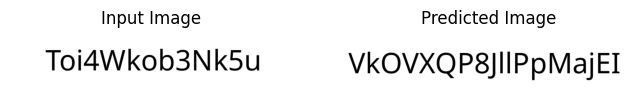

Prediction for 1229 is 1207, the font is NotoSansThaiLooped


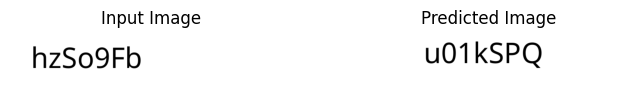

Prediction for 1231 is 1143, the font is NotoSansTifinagh


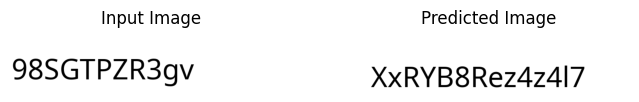

Prediction for 1235 is 1207, the font is NotoSansVithkuqi


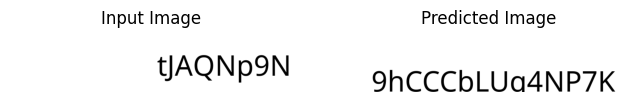

Prediction for 1236 is 1209, the font is NotoSansWancho


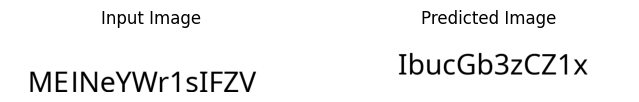

Prediction for 1238 is 1143, the font is NotoSansYi


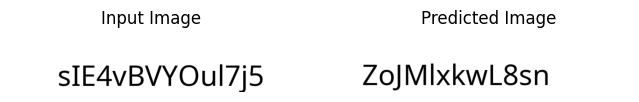

Prediction for 1239 is 1159, the font is NotoSansZanabazarSquare


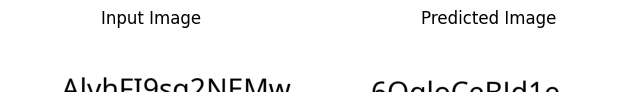

Prediction for 1241 is 1271, the font is NotoSerifAhom


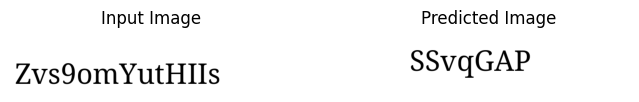

Prediction for 1242 is 1263, the font is NotoSerifArmenian


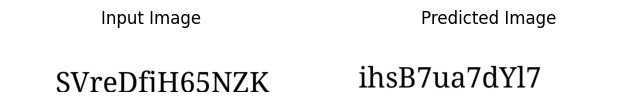

Prediction for 1243 is 1271, the font is NotoSerifBalinese


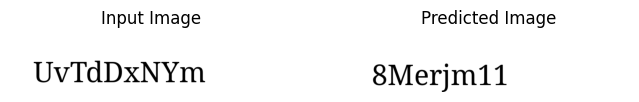

Prediction for 1244 is 1267, the font is NotoSerifBengali


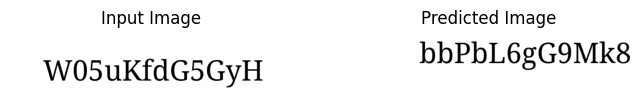

Prediction for 1245 is 1064, the font is NotoSerifDevanagari


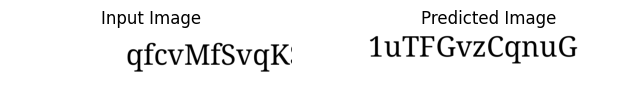

Prediction for 1249 is 1064, the font is NotoSerifEthiopic


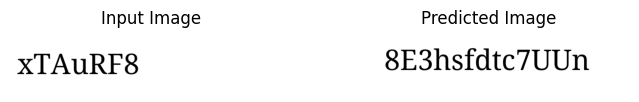

Prediction for 1250 is 1267, the font is NotoSerifGeorgian


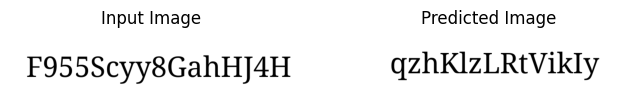

Prediction for 1251 is 1271, the font is NotoSerifGrantha


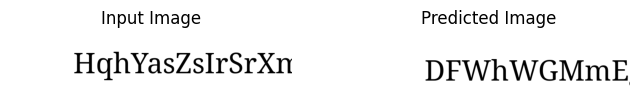

Prediction for 1252 is 1267, the font is NotoSerifGujarati


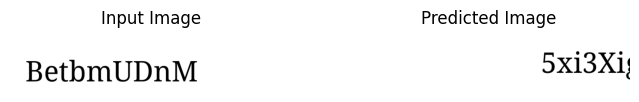

Prediction for 1254 is 1272, the font is NotoSerifHK


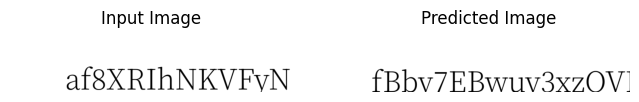

Prediction for 1255 is 1267, the font is NotoSerifHebrew


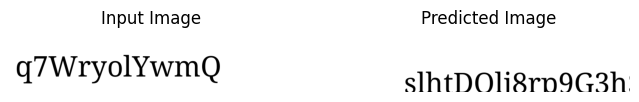

Prediction for 1257 is 1274, the font is NotoSerifJP


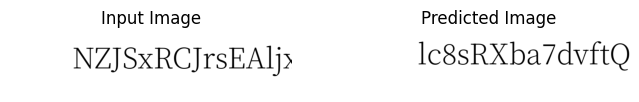

Prediction for 1258 is 1274, the font is NotoSerifKR


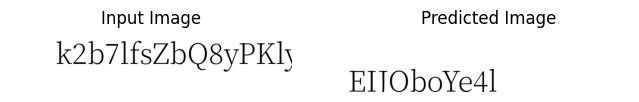

Prediction for 1261 is 1064, the font is NotoSerifKhmer


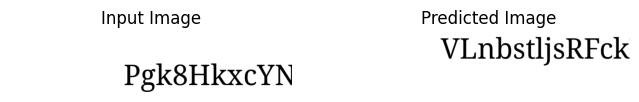

Prediction for 1263 is 1064, the font is NotoSerifLao


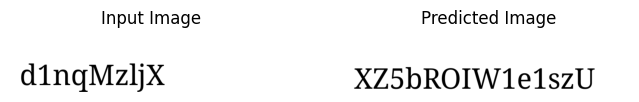

Prediction for 1264 is 1247, the font is NotoSerifMakasar


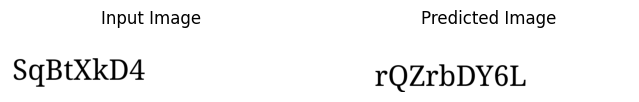

Prediction for 1265 is 1064, the font is NotoSerifMalayalam


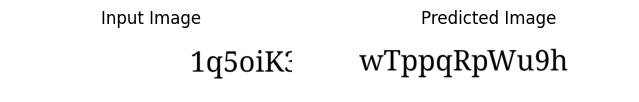

Prediction for 1268 is 1230, the font is NotoSerifNyiakengPuachueHmong


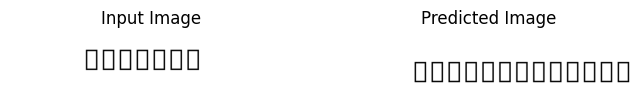

Prediction for 1270 is 1253, the font is NotoSerifOriya


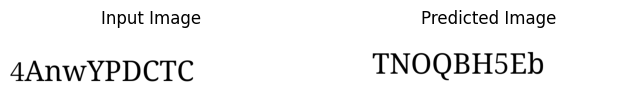

Prediction for 1272 is 1257, the font is NotoSerifSC


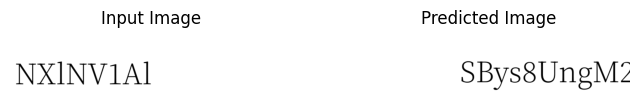

Prediction for 1278 is 1267, the font is NotoSerifThai


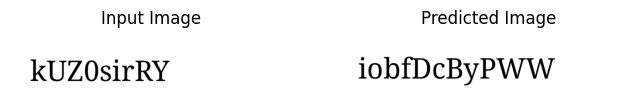

Prediction for 1279 is 1267, the font is NotoSerifTibetan


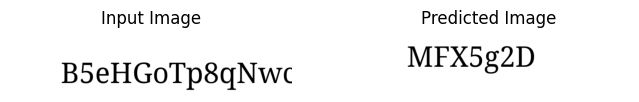

Prediction for 1281 is 1267, the font is NotoSerifToto


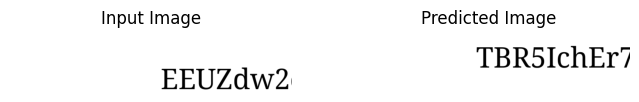

Prediction for 1282 is 1064, the font is NotoSerifVithkuqi


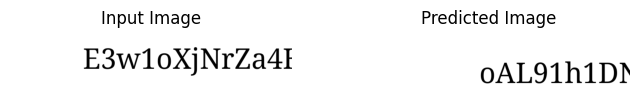

Prediction for 1283 is 1064, the font is NotoSerifYezidi


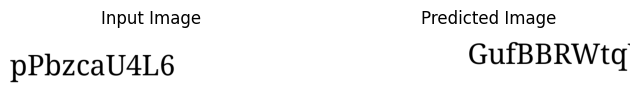

Prediction for 1284 is 1207, the font is NotoTraditionalNushu


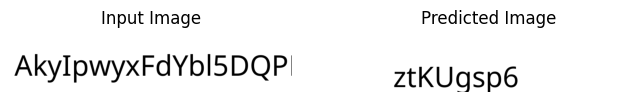

Prediction for 1285 is 1232, the font is NotoZnamennyMusicalNotation


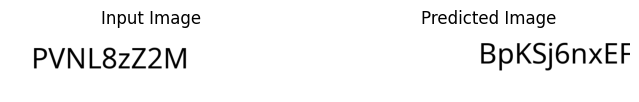

Prediction for 1311 is 1913, the font is OpenSans


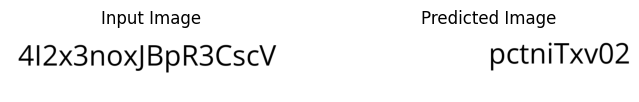

Prediction for 1329 is 315, the font is OvertheRainbow


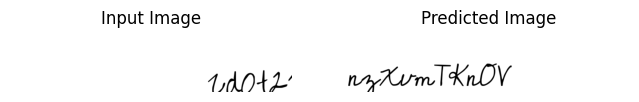

Prediction for 1355 is 553, the font is Pattaya


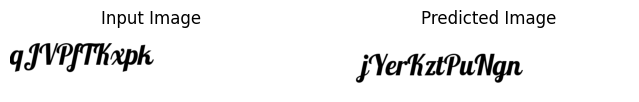

Prediction for 1392 is 1482, the font is PlaywriteAUQLDGuides


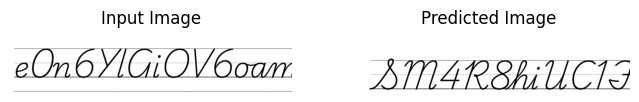

Prediction for 1395 is 1465, the font is PlaywriteAUTAS


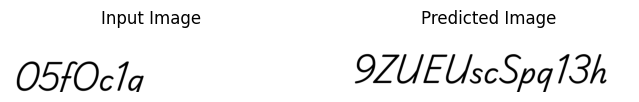

Prediction for 1401 is 1445, the font is PlaywriteBEWAL


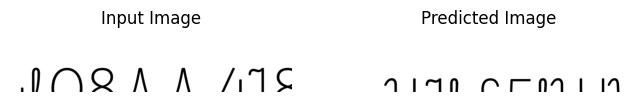

Prediction for 1413 is 1475, the font is PlaywriteCZ


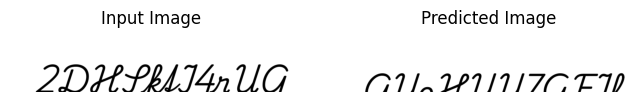

Prediction for 1428 is 1467, the font is PlaywriteESDeco


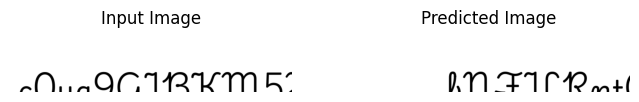

Prediction for 1436 is 1454, the font is PlaywriteGBJGuides


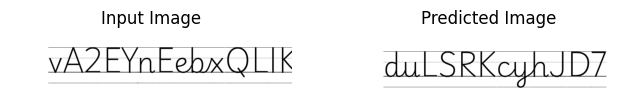

Prediction for 1444 is 1456, the font is PlaywriteHUGuides


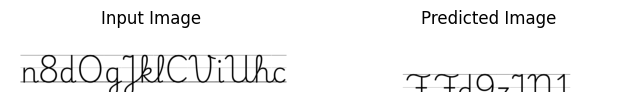

Prediction for 1457 is 1473, the font is PlaywriteMX


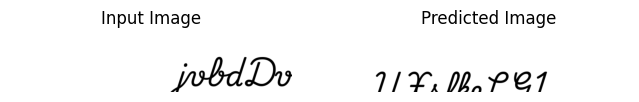

Prediction for 1488 is 1841, the font is Pochaevsk


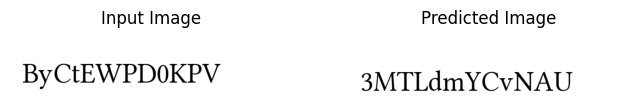

Prediction for 1498 is 1841, the font is Ponomar


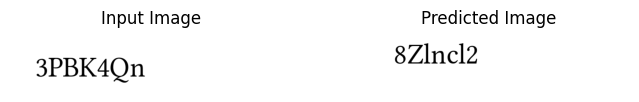

Prediction for 1553 is 1933, the font is Rasa


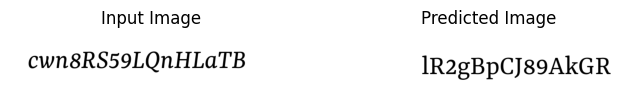

Prediction for 1556 is 840, the font is ReadexPro


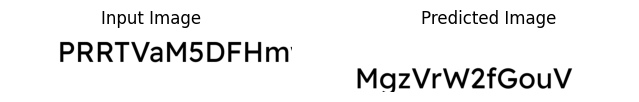

Prediction for 1573 is 394, the font is RethinkSans


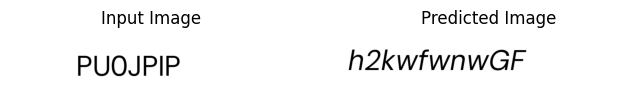

Prediction for 1586 is 630, the font is RobotoSlab


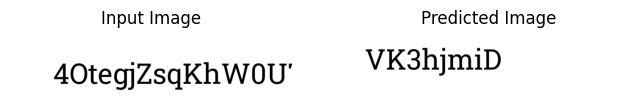

Prediction for 1643 is 323, the font is Sacramento


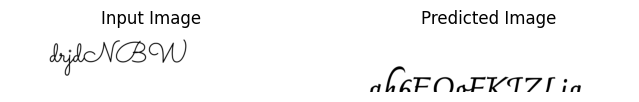

Prediction for 1685 is 1640, the font is Shafarik


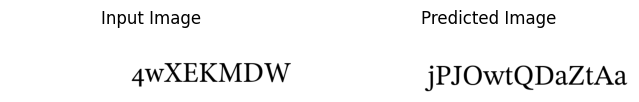

Prediction for 1700 is 328, the font is Siemreap


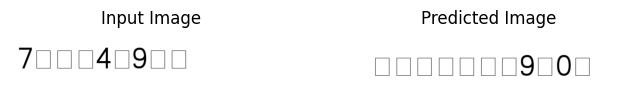

Prediction for 1745 is 122, the font is SourceSans3


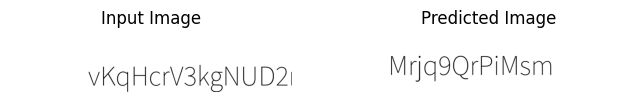

Prediction for 1790 is 182, the font is Suwannaphum


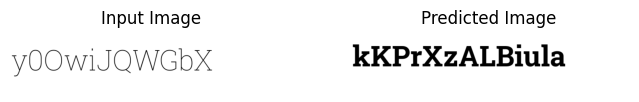

Prediction for 1802 is 1673, the font is Taprom


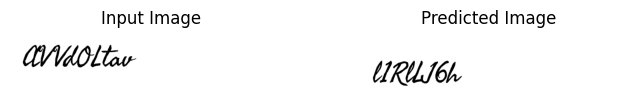

Prediction for 1804 is 1842, the font is Taviraj


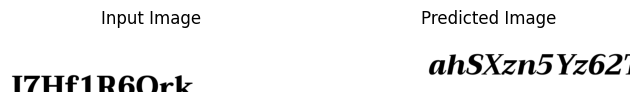

Prediction for 1812 is 1888, the font is Texturina


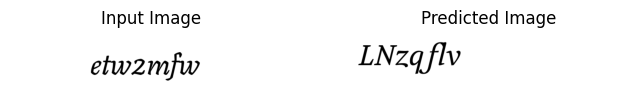

Prediction for 1896 is 1958, the font is WaitingfortheSunrise


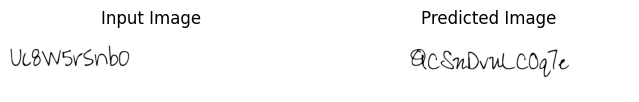

Prediction for 1947 is 632, the font is Zain


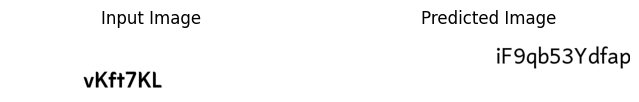

In [31]:
for i in range(1963):
    image = dg[i][0].unsqueeze(0)
    prediction = torch.argmax(model(image)).item()

    if prediction >= i + 10 or prediction <= i - 10:
        print(f"Prediction for {i} is {prediction}, the font is {dg.fonts_unique[i]}")

        prediction = dg[prediction][0]

        fig, axs = plt.subplots(1, 2, figsize=(8, 4))
        axs[0].imshow(image.squeeze().numpy(), cmap='gray')
        axs[0].set_title('Input Image')
        axs[0].axis('off')
        axs[1].imshow(prediction.squeeze().numpy(), cmap='gray')
        axs[1].set_title('Predicted Image')
        axs[1].axis('off')
        plt.show()


/tmp/ipykernel_57366/501673388.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  raw_prediction = torch.topk(torch.nn.functional.softmax(model(image)), 5)


Prediction for 253 is 1759, the font is Borel


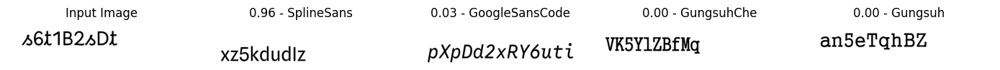

Prediction for 362 is 328, the font is Content


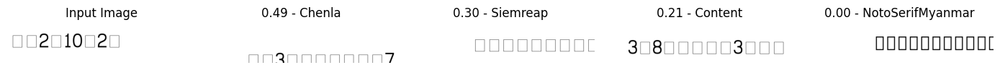

Prediction for 440 is 196, the font is EBGaramond


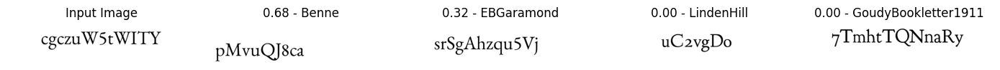

Prediction for 531 is 495, the font is Freehand


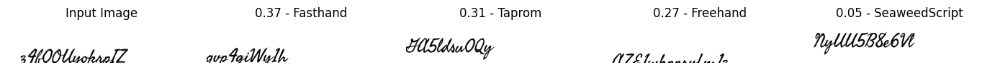

Prediction for 585 is 201, the font is GoblinOne


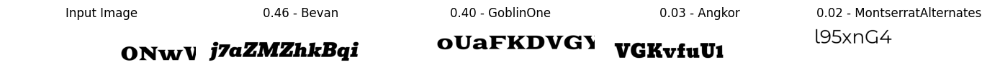

Prediction for 793 is 686, the font is KleeOne


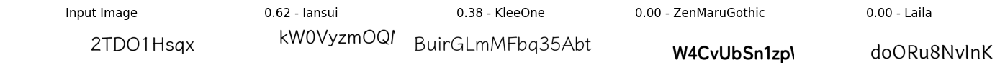

Prediction for 800 is 629, the font is Kokoro


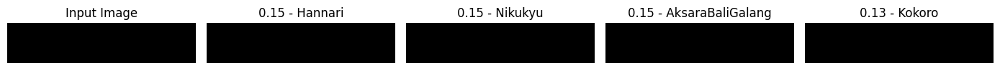

Prediction for 811 is 508, the font is Krub


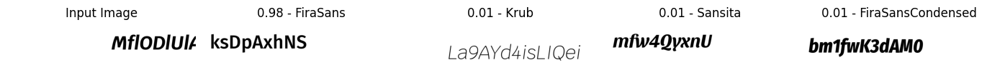

Prediction for 850 is 66, the font is LibertinusSerif


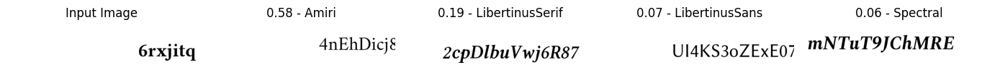

Prediction for 871 is 616, the font is LisuBosa


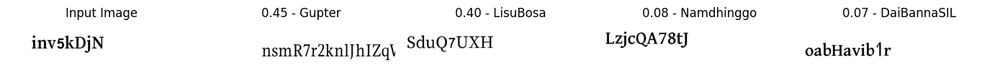

Prediction for 903 is 416, the font is MaShanZheng


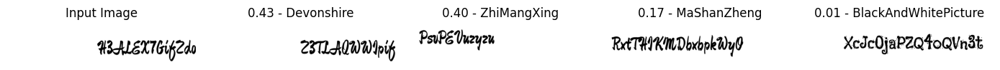

Prediction for 1001 is 201, the font is Moul


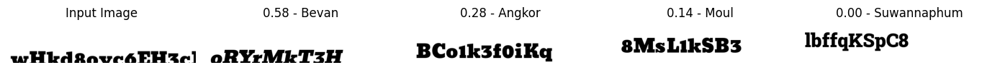

Prediction for 1047 is 629, the font is Nikukyu


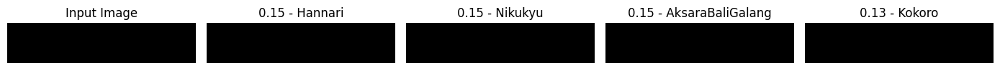

Prediction for 1060 is 1232, the font is NotoMusic


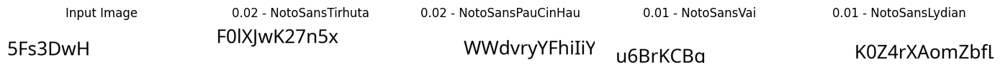

Prediction for 1061 is 1267, the font is NotoNaskhArabic


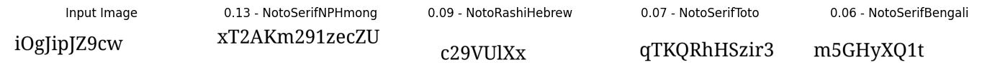

Prediction for 1065 is 1207, the font is NotoSans


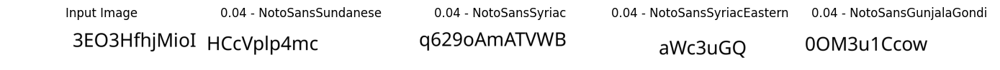

Prediction for 1066 is 1221, the font is NotoSansAdlam


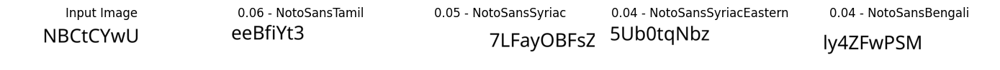

Prediction for 1068 is 1209, the font is NotoSansAnatolianHieroglyphs


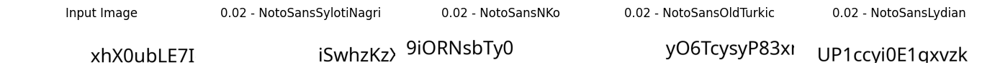

Prediction for 1069 is 1207, the font is NotoSansArabic


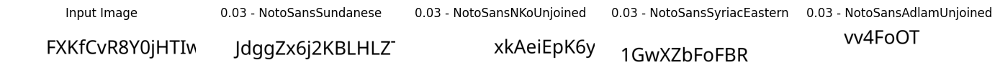

Prediction for 1072 is 1182, the font is NotoSansAvestan


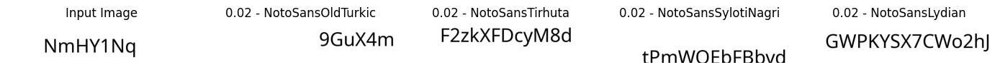

Prediction for 1073 is 1207, the font is NotoSansBalinese


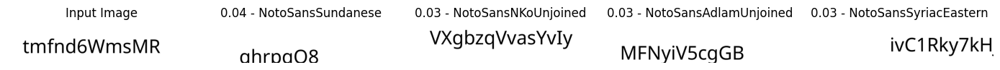

Prediction for 1074 is 1207, the font is NotoSansBamum


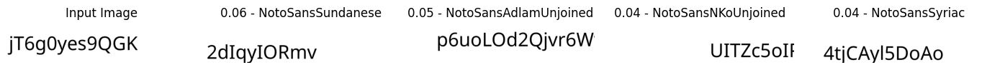

Prediction for 1075 is 1207, the font is NotoSansBassaVah


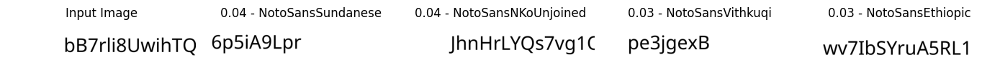

Prediction for 1076 is 1232, the font is NotoSansBatak


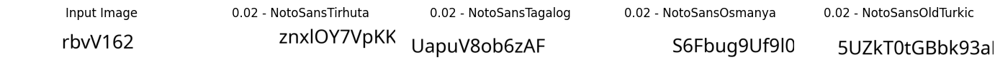

Prediction for 1077 is 1183, the font is NotoSansBengali


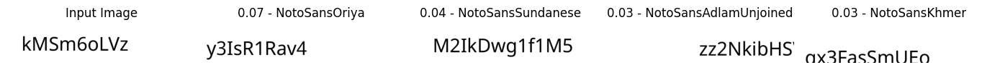

Prediction for 1079 is 1232, the font is NotoSansBhaiksuki


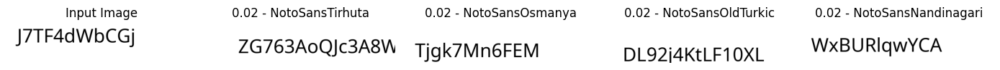

Prediction for 1080 is 1232, the font is NotoSansBrahmi


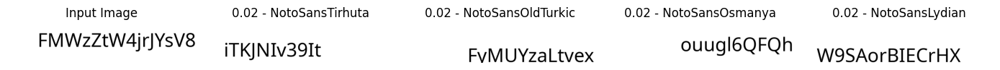

Prediction for 1081 is 1143, the font is NotoSansBuginese


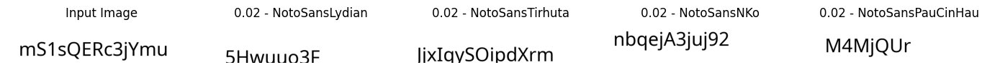

Prediction for 1082 is 1212, the font is NotoSansBuhid


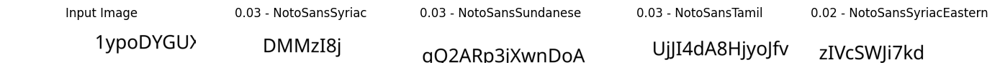

Prediction for 1083 is 1221, the font is NotoSansCanadianAboriginal


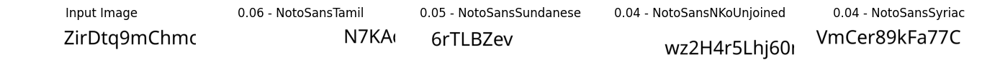

Prediction for 1084 is 1232, the font is NotoSansCarian


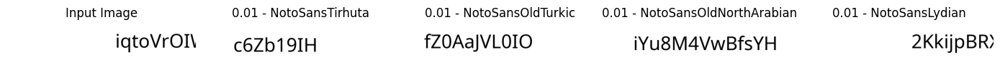

Prediction for 1085 is 1143, the font is NotoSansCaucasianAlbanian


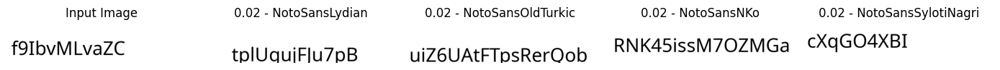

Prediction for 1086 is 1232, the font is NotoSansChakma


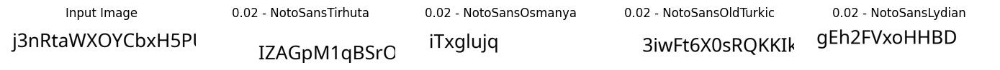

Prediction for 1087 is 1207, the font is NotoSansCham


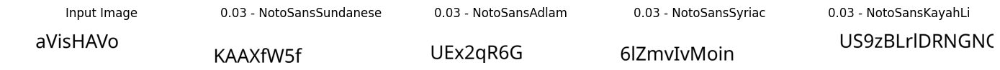

Prediction for 1088 is 1207, the font is NotoSansCherokee


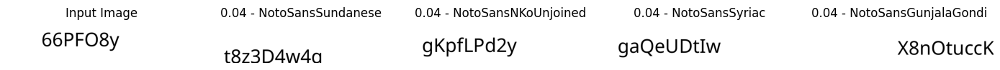

Prediction for 1089 is 1232, the font is NotoSansChorasmian


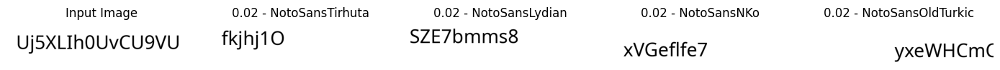

Prediction for 1090 is 1232, the font is NotoSansCoptic


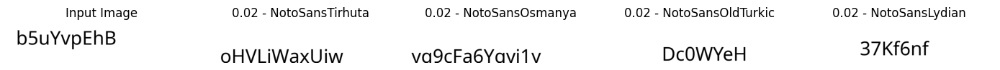

Prediction for 1091 is 1159, the font is NotoSansCuneiform


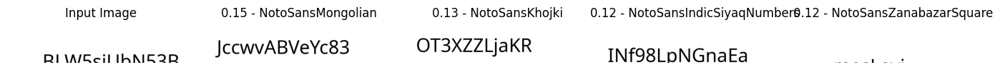

Prediction for 1092 is 1232, the font is NotoSansCypriot


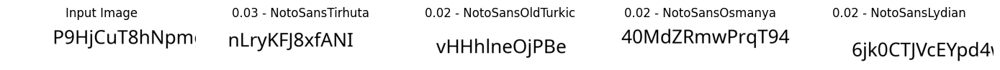

Prediction for 1093 is 1232, the font is NotoSansCyproMinoan


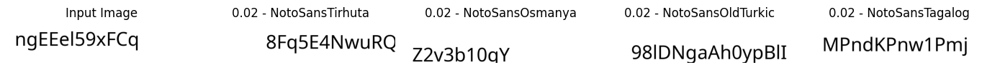

Prediction for 1094 is 1149, the font is NotoSansDeseret


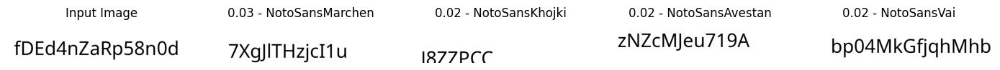

Prediction for 1099 is 1165, the font is NotoSansEgyptianHieroglyphs


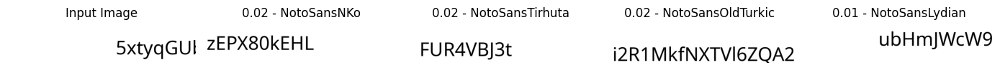

Prediction for 1100 is 1232, the font is NotoSansElbasan


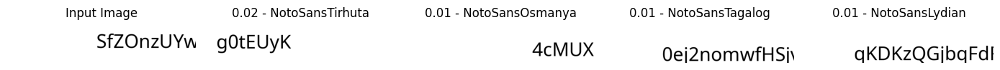

Prediction for 1101 is 1182, the font is NotoSansElymaic


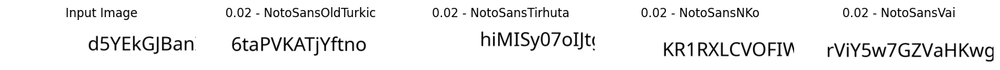

Prediction for 1102 is 1207, the font is NotoSansEthiopic


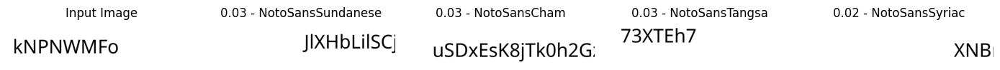

Prediction for 1103 is 1207, the font is NotoSansGeorgian


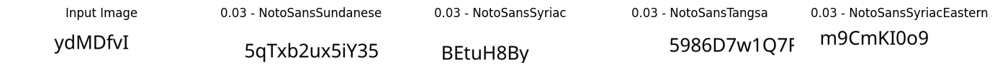

Prediction for 1104 is 1239, the font is NotoSansGlagolitic


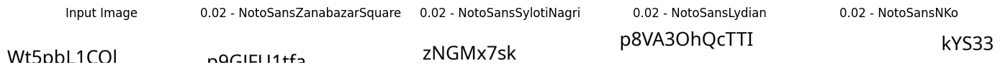

Prediction for 1105 is 1232, the font is NotoSansGothic


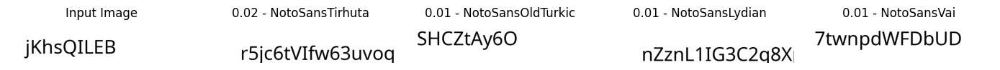

Prediction for 1106 is 1159, the font is NotoSansGrantha


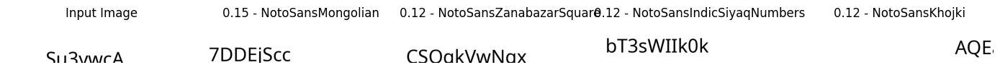

Prediction for 1107 is 1067, the font is NotoSansGujarati


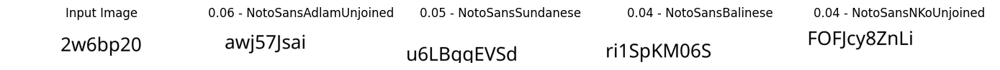

Prediction for 1109 is 1235, the font is NotoSansGunjalaGondi


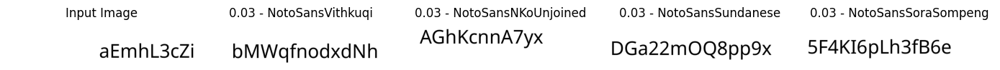

Prediction for 1110 is 1095, the font is NotoSansGurmukhi


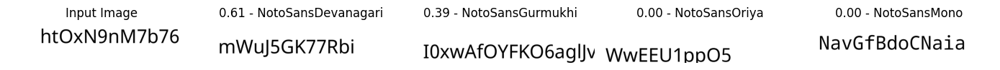

Prediction for 1111 is 1078, the font is NotoSansGurmukhiUI


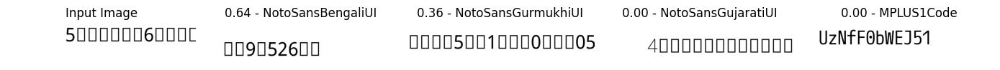

Prediction for 1113 is 1067, the font is NotoSansHanifiRohingya


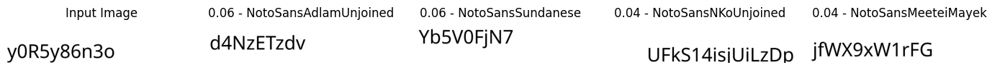

Prediction for 1114 is 1165, the font is NotoSansHanunoo


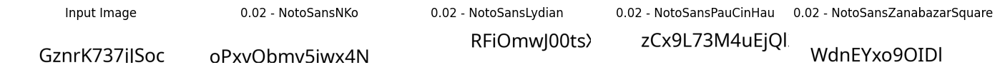

Prediction for 1115 is 1165, the font is NotoSansHatran


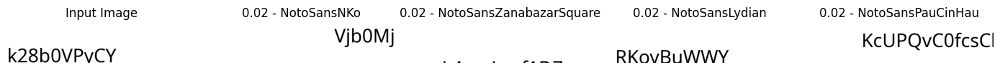

Prediction for 1117 is 1239, the font is NotoSansImperialAramaic


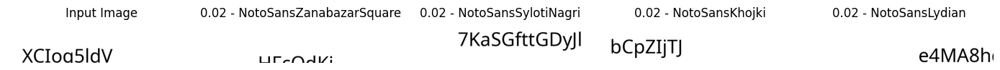

Prediction for 1118 is 1232, the font is NotoSansIndicSiyaqNumbers


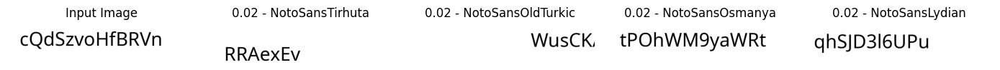

Prediction for 1119 is 1147, the font is NotoSansInscriptionalPahlavi


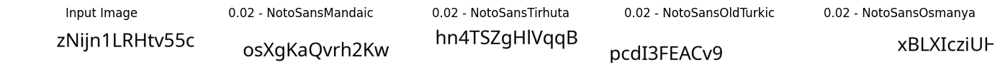

Prediction for 1120 is 1177, the font is NotoSansInscriptionalParthian


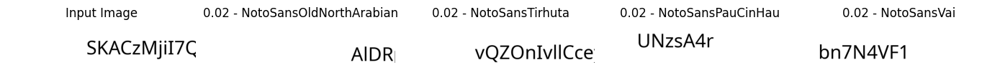

Prediction for 1124 is 1232, the font is NotoSansKaithi


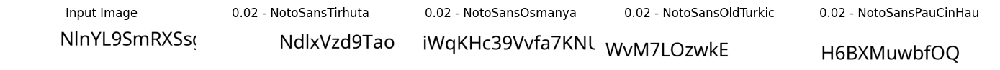

Prediction for 1125 is 1221, the font is NotoSansKannada


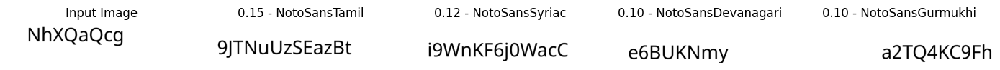

Prediction for 1127 is 1073, the font is NotoSansKawi


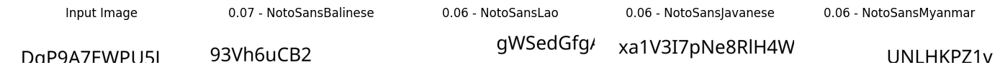

Prediction for 1128 is 1207, the font is NotoSansKayahLi


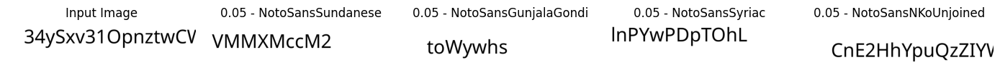

Prediction for 1129 is 1165, the font is NotoSansKharoshthi


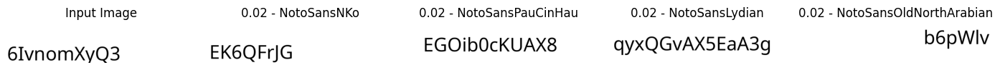

Prediction for 1130 is 1212, the font is NotoSansKhmer


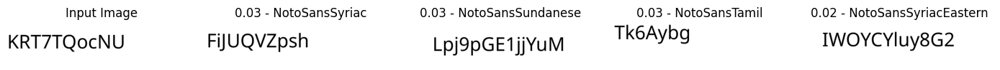

Prediction for 1133 is 1147, the font is NotoSansKhudawadi


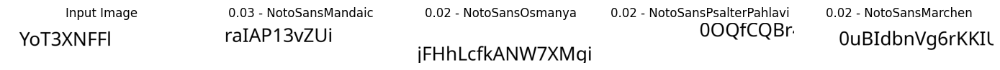

Prediction for 1134 is 1207, the font is NotoSansLao


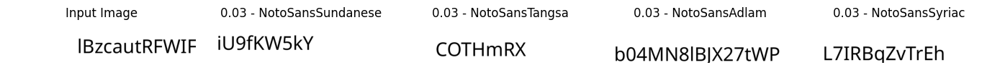

Prediction for 1135 is 1073, the font is NotoSansLaoLooped


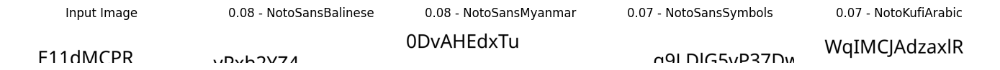

Prediction for 1137 is 1232, the font is NotoSansLepcha


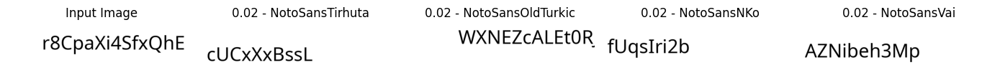

Prediction for 1139 is 1149, the font is NotoSansLinearA


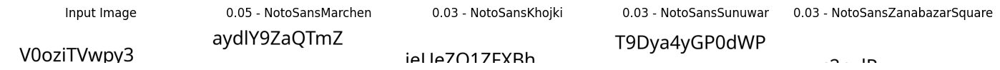

Prediction for 1140 is 1182, the font is NotoSansLinearB


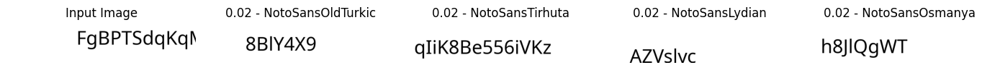

Prediction for 1141 is 1212, the font is NotoSansLisu


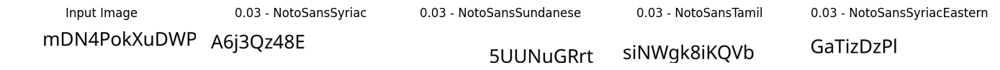

Prediction for 1142 is 1232, the font is NotoSansLycian


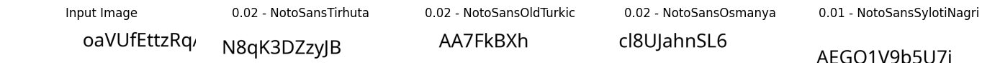

Prediction for 1143 is 1165, the font is NotoSansLydian


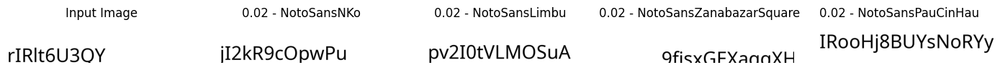

Prediction for 1145 is 1207, the font is NotoSansMalayalam


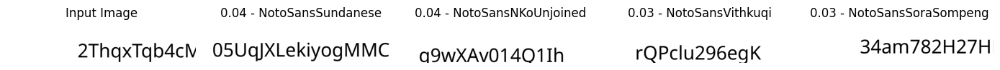

Prediction for 1147 is 1165, the font is NotoSansMandaic


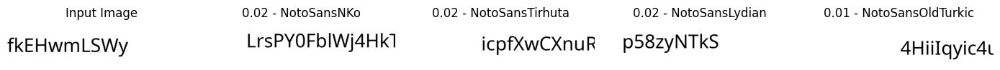

Prediction for 1150 is 1232, the font is NotoSansMasaramGondi


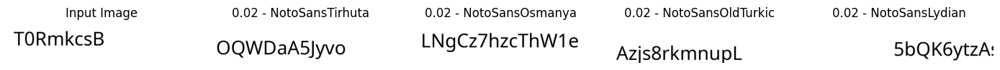

Prediction for 1151 is 1232, the font is NotoSansMath


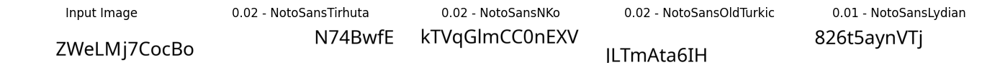

Prediction for 1152 is 1232, the font is NotoSansMayanNumerals


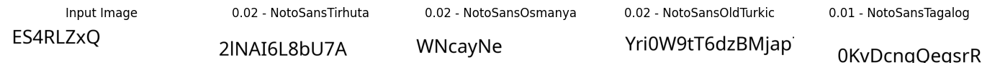

Prediction for 1153 is 1183, the font is NotoSansMedefaidrin


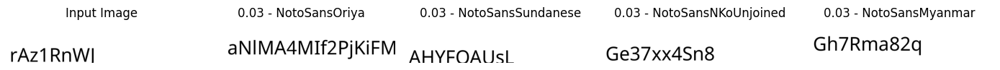

Prediction for 1154 is 1207, the font is NotoSansMeeteiMayek


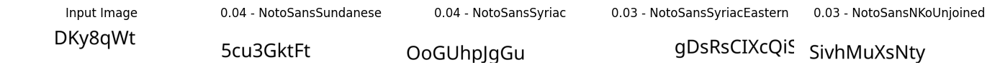

Prediction for 1155 is 1165, the font is NotoSansMendeKikakui


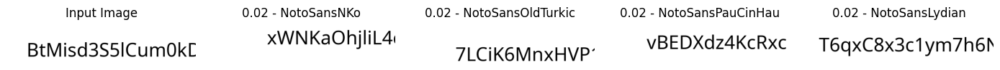

Prediction for 1156 is 1232, the font is NotoSansMeroitic


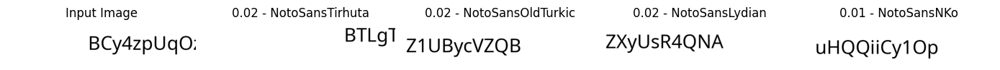

Prediction for 1157 is 1232, the font is NotoSansMiao


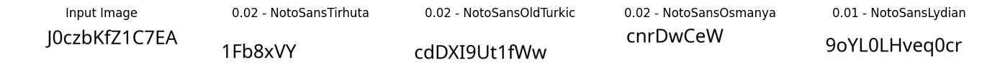

Prediction for 1158 is 1232, the font is NotoSansModi


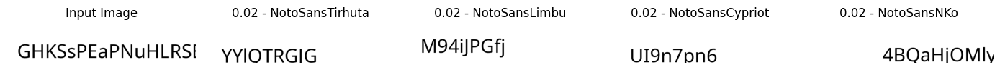

Prediction for 1161 is 1232, the font is NotoSansMro


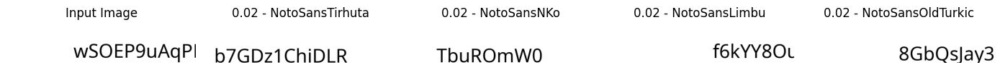

Prediction for 1163 is 1067, the font is NotoSansMyanmar


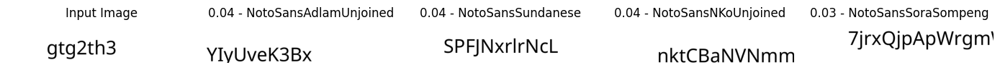

Prediction for 1167 is 1232, the font is NotoSansNabataean


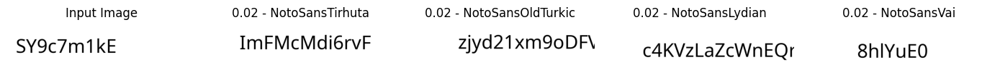

Prediction for 1170 is 1207, the font is NotoSansNewTaiLue


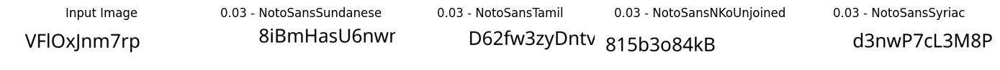

Prediction for 1172 is 1182, the font is NotoSansNushu


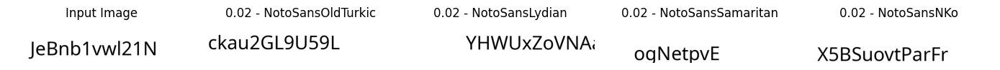

Prediction for 1173 is 1232, the font is NotoSansOgham


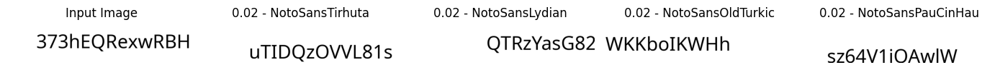

Prediction for 1174 is 1207, the font is NotoSansOlChiki


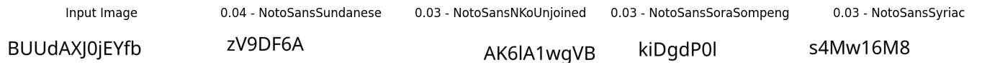

Prediction for 1175 is 1232, the font is NotoSansOldHungarian


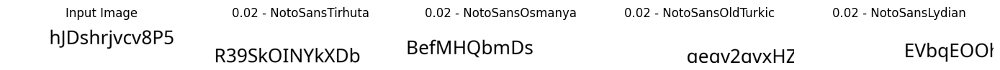

Prediction for 1178 is 1232, the font is NotoSansOldPermic


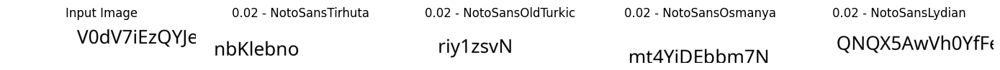

Prediction for 1179 is 1232, the font is NotoSansOldPersian


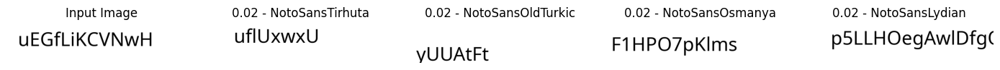

Prediction for 1180 is 1232, the font is NotoSansOldSogdian


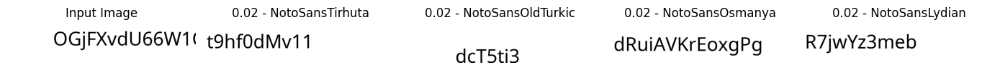

Prediction for 1181 is 1232, the font is NotoSansOldSouthArabian


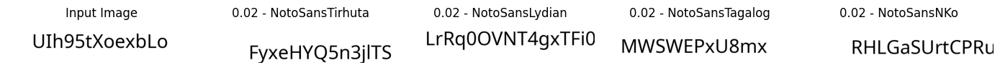

Prediction for 1187 is 1209, the font is NotoSansPahawhHmong


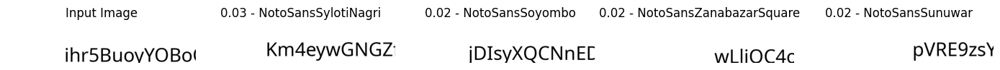

Prediction for 1188 is 1232, the font is NotoSansPalmyrene


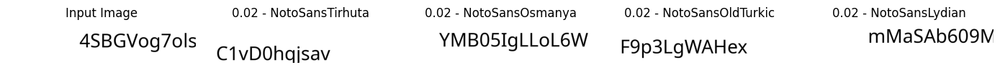

Prediction for 1189 is 1165, the font is NotoSansPauCinHau


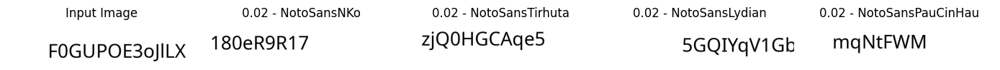

Prediction for 1190 is 1232, the font is NotoSansPhagsPa


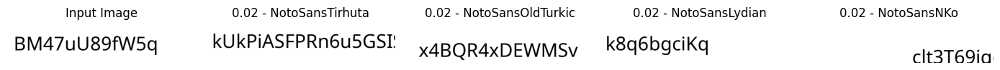

Prediction for 1191 is 1072, the font is NotoSansPhoenician


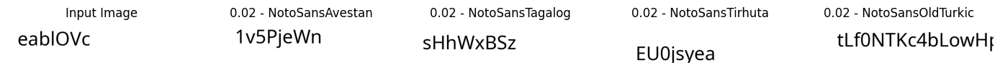

Prediction for 1192 is 1143, the font is NotoSansPsalterPahlavi


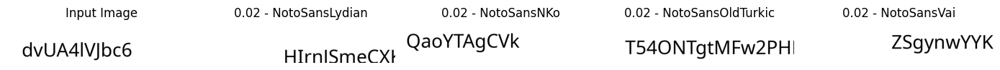

Prediction for 1193 is 1143, the font is NotoSansRejang


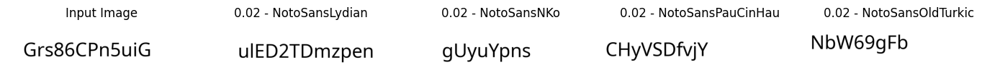

Prediction for 1194 is 1232, the font is NotoSansRunic


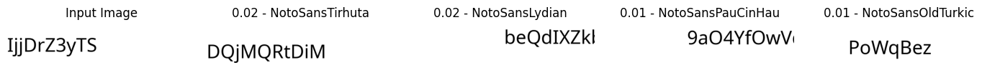

Prediction for 1195 is 1123, the font is NotoSansSC


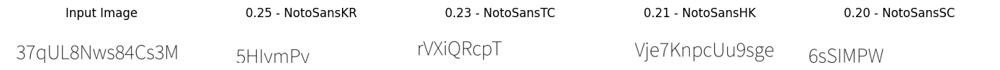

Prediction for 1196 is 1165, the font is NotoSansSamaritan


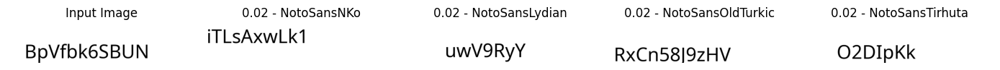

Prediction for 1197 is 1209, the font is NotoSansSaurashtra


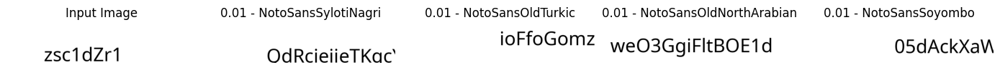

Prediction for 1198 is 1072, the font is NotoSansSharada


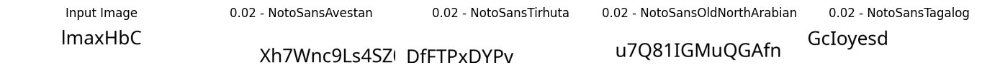

Prediction for 1199 is 1165, the font is NotoSansShavian


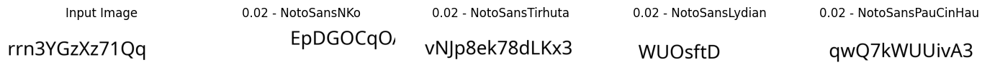

Prediction for 1200 is 1232, the font is NotoSansSiddham


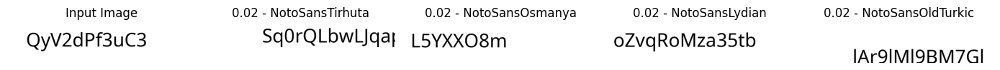

Prediction for 1201 is 1232, the font is NotoSansSignWriting


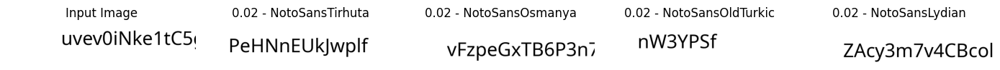

Prediction for 1204 is 1232, the font is NotoSansSogdian


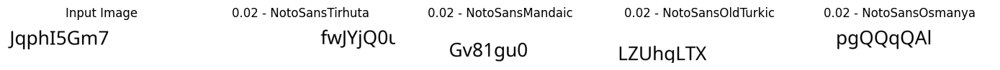

Prediction for 1206 is 1232, the font is NotoSansSoyombo


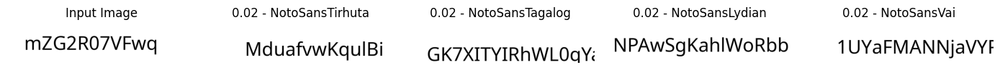

Prediction for 1207 is 1166, the font is NotoSansSundanese


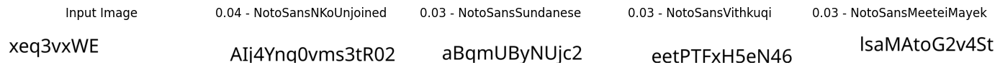

Prediction for 1208 is 1165, the font is NotoSansSunuwar


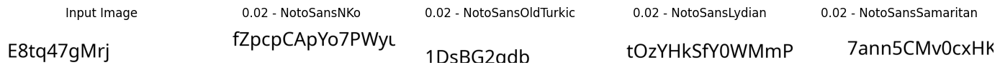

Prediction for 1209 is 1232, the font is NotoSansSylotiNagri


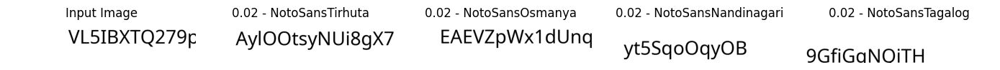

Prediction for 1214 is 1123, the font is NotoSansTC


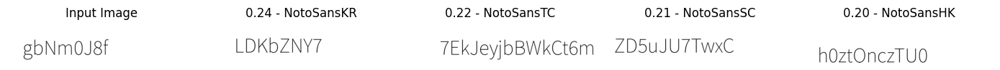

Prediction for 1215 is 1165, the font is NotoSansTagalog


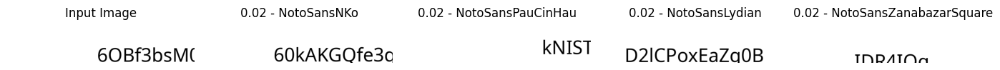

Prediction for 1216 is 1232, the font is NotoSansTagbanwa


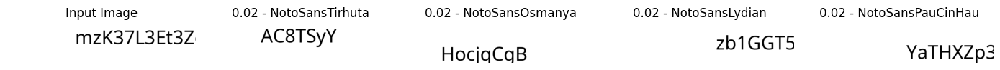

Prediction for 1217 is 1239, the font is NotoSansTaiLe


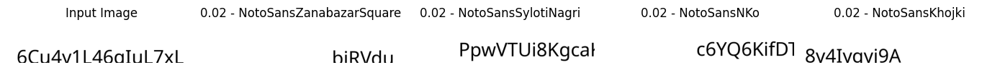

Prediction for 1218 is 1207, the font is NotoSansTaiTham


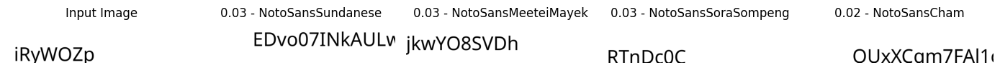

Prediction for 1219 is 1165, the font is NotoSansTaiViet


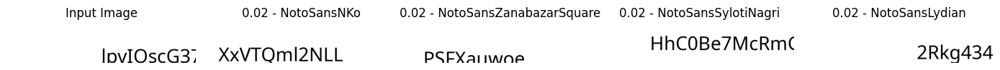

Prediction for 1220 is 1232, the font is NotoSansTakri


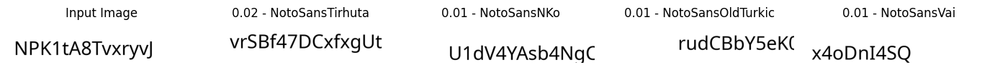

Prediction for 1221 is 1207, the font is NotoSansTamil


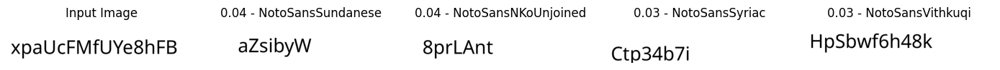

Prediction for 1222 is 1143, the font is NotoSansTamilSupplement


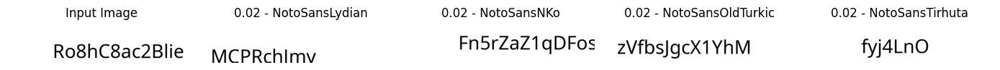

Prediction for 1224 is 1207, the font is NotoSansTangsa


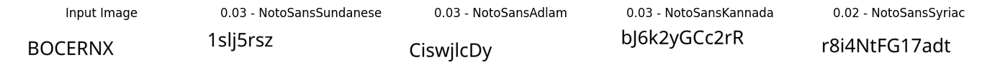

Prediction for 1225 is 1125, the font is NotoSansTelugu


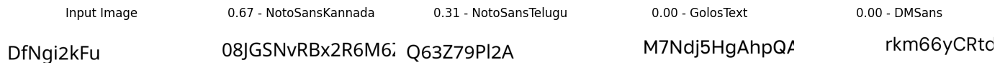

Prediction for 1227 is 1073, the font is NotoSansThaana


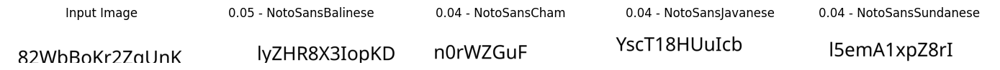

Prediction for 1228 is 1207, the font is NotoSansThai


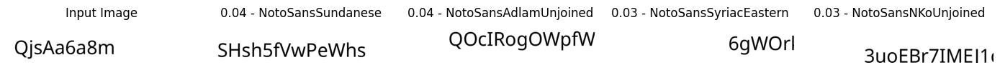

Prediction for 1229 is 1166, the font is NotoSansThaiLooped


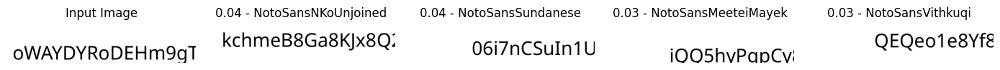

Prediction for 1231 is 1149, the font is NotoSansTifinagh


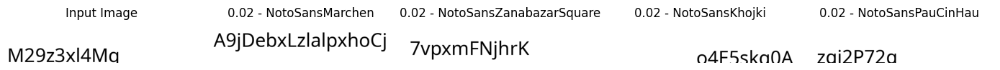

Prediction for 1233 is 1165, the font is NotoSansUgaritic


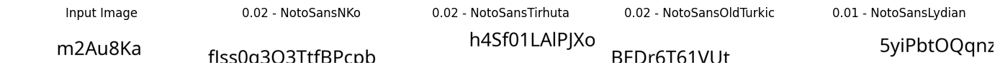

Prediction for 1234 is 1143, the font is NotoSansVai


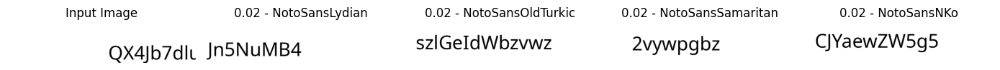

Prediction for 1235 is 1183, the font is NotoSansVithkuqi


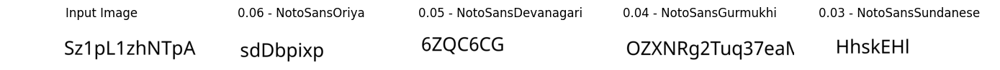

Prediction for 1236 is 1159, the font is NotoSansWancho


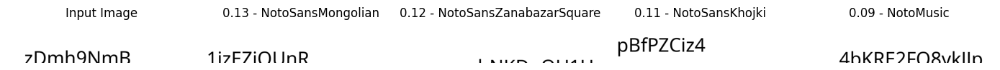

Prediction for 1238 is 1209, the font is NotoSansYi


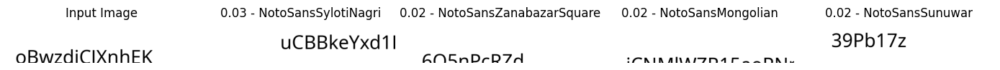

Prediction for 1241 is 1271, the font is NotoSerifAhom


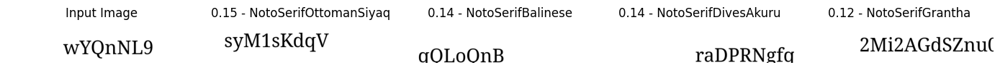

Prediction for 1242 is 1267, the font is NotoSerifArmenian


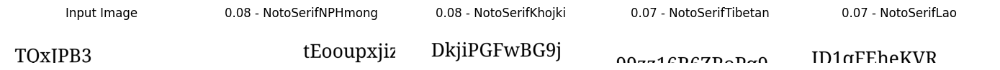

Prediction for 1244 is 1263, the font is NotoSerifBengali


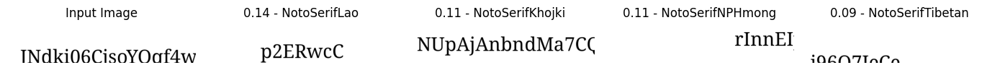

Prediction for 1245 is 1064, the font is NotoSerifDevanagari


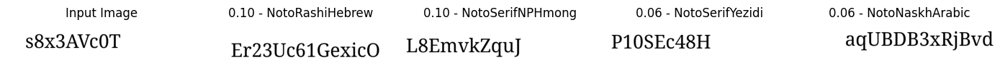

Prediction for 1249 is 1064, the font is NotoSerifEthiopic


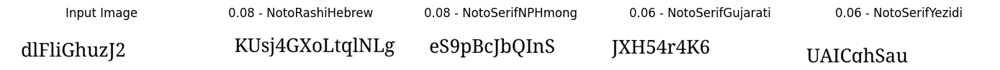

Prediction for 1250 is 1267, the font is NotoSerifGeorgian


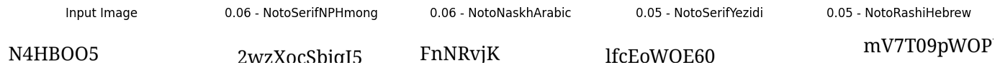

Prediction for 1255 is 1267, the font is NotoSerifHebrew


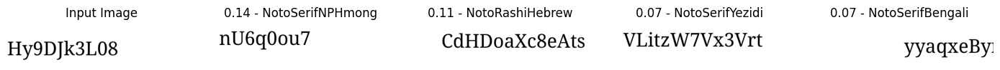

Prediction for 1261 is 1064, the font is NotoSerifKhmer


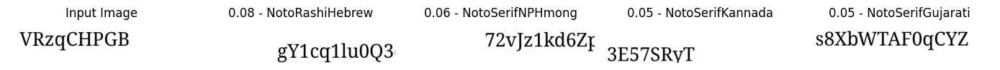

Prediction for 1265 is 1064, the font is NotoSerifMalayalam


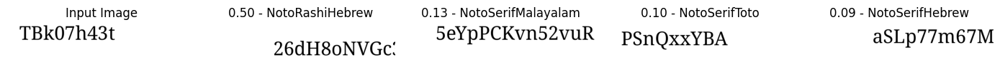

Prediction for 1267 is 1064, the font is NotoSerifNPHmong


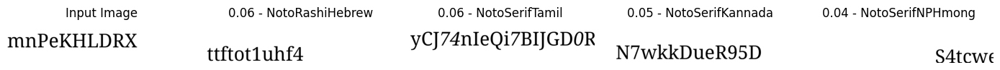

Prediction for 1268 is 1230, the font is NotoSerifNyiakengPuachueHmong


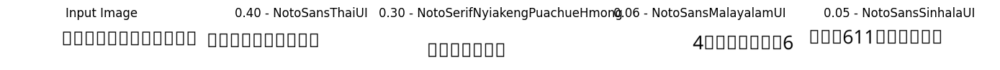

Prediction for 1269 is 1241, the font is NotoSerifOldUyghur


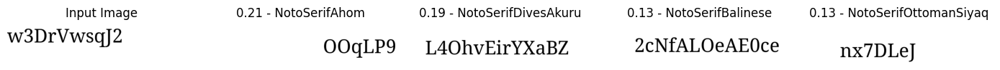

Prediction for 1278 is 1267, the font is NotoSerifThai


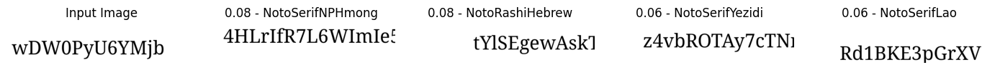

Prediction for 1279 is 1267, the font is NotoSerifTibetan


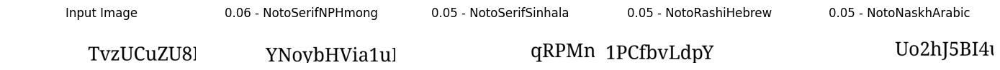

Prediction for 1281 is 1267, the font is NotoSerifToto


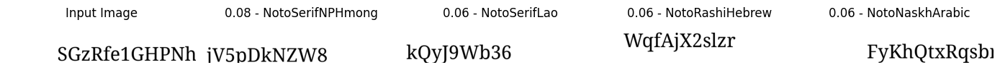

Prediction for 1282 is 1064, the font is NotoSerifVithkuqi


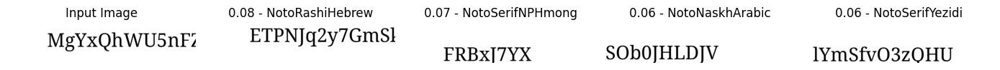

Prediction for 1283 is 1267, the font is NotoSerifYezidi


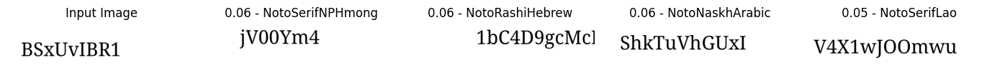

Prediction for 1284 is 1212, the font is NotoTraditionalNushu


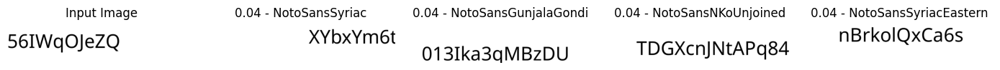

Prediction for 1285 is 1232, the font is NotoZnamennyMusicalNotation


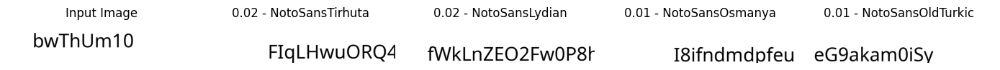

Prediction for 1316 is 393, the font is Orbit


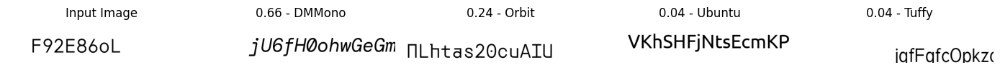

Prediction for 1319 is 622, the font is OrelegaOne


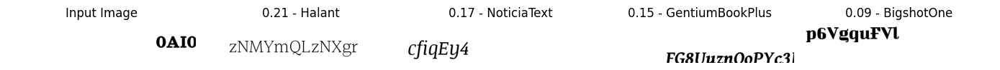

Prediction for 1335 is 665, the font is PT_Sans


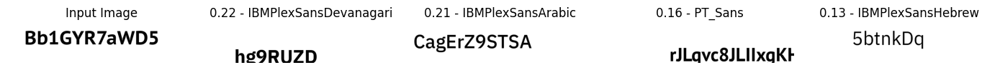

Prediction for 1355 is 553, the font is Pattaya


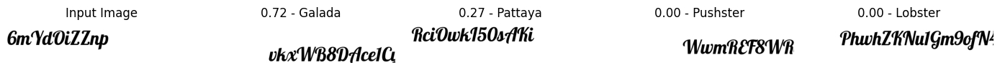

Prediction for 1453 is 1437, the font is PlaywriteITModerna


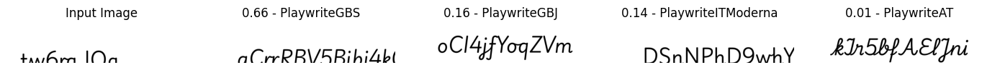

Prediction for 1468 is 1429, the font is PlaywritePEGuides


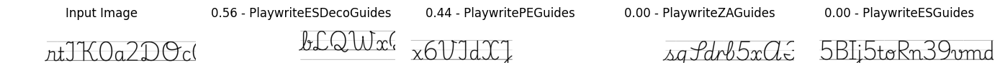

Prediction for 1470 is 1429, the font is PlaywritePLGuides


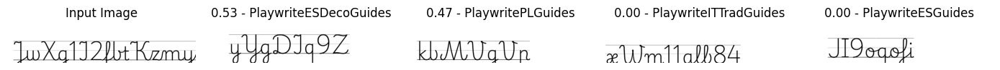

Prediction for 1476 is 1414, the font is PlaywriteSKGuides


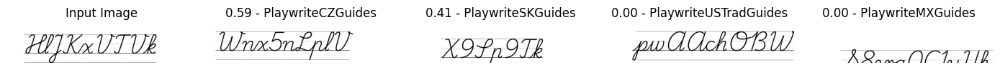

Prediction for 1556 is 840, the font is ReadexPro


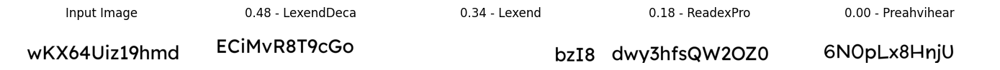

Prediction for 1586 is 630, the font is RobotoSlab


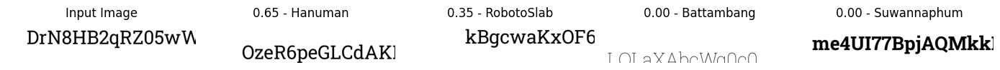

Prediction for 1598 is 899, the font is RoundedMplus1c


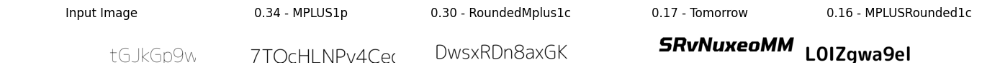

Prediction for 1663 is 537, the font is SassyFrass


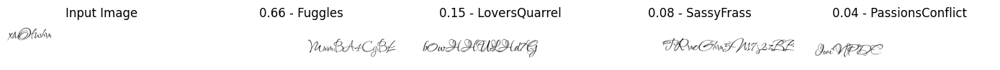

Prediction for 1673 is 495, the font is SeaweedScript


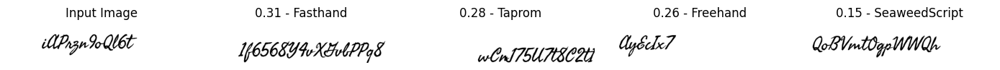

Prediction for 1700 is 328, the font is Siemreap


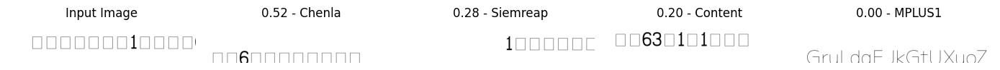

Prediction for 1708 is 248, the font is Simonetta


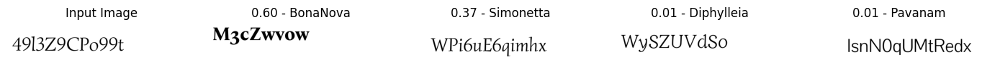

Prediction for 1766 is 184, the font is Staatliches


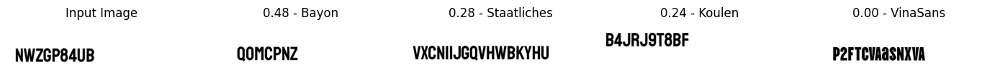

Prediction for 1790 is 182, the font is Suwannaphum


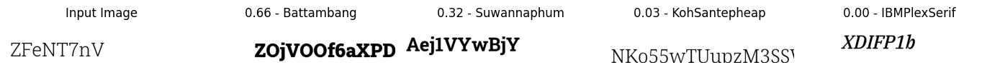

Prediction for 1823 is 51, the font is TiltWarp


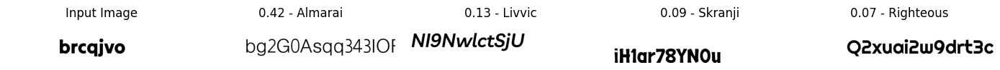

Prediction for 1953 is 1931, the font is ZenKurenaido


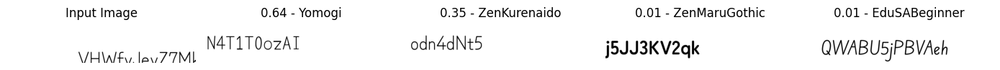

In [71]:
for i in range(1963):
    image = dg[i][0].unsqueeze(0)
    raw_prediction = torch.topk(torch.nn.functional.softmax(model(image)), 5)
    predictions = raw_prediction.indices.tolist()[0]
    prediction = predictions[0]

    # 
    if not i in predictions and prediction >= i + 10 or prediction <= i - 10:
        print(f"Prediction for {i} is {prediction}, the font is {dg.fonts_unique[i]}")



        fig, axs = plt.subplots(1, 5, figsize=(14, 8))
        axs[0].imshow(image.squeeze().numpy(), cmap='gray')
        axs[0].set_title('Input Image')
        axs[0].axis('off')
        for i in range(1, 5):
            prediction = predictions[i-1]
            prediction = dg[prediction][0]
            axs[i].imshow(prediction.squeeze().numpy(), cmap='gray')
            axs[i].set_title(f'{raw_prediction.values.tolist()[0][i-1]:.2f} - {dg.fonts_unique[predictions[i-1]]}')
            axs[i].axis('off')
        plt.tight_layout()
        plt.show()
